# Green Fuel Break — Per-Segment Cost Model (Implementation & Maintenance)
### North Kona–South Kohala, Hawaiʻi Island

This notebook calculates the **total per-segment cost** of establishing and maintaining
road-anchored green fuel breaks, separating:

* **Implementation cost** — one-time establishment (plant material, outplanting labor, site
  preparation / grass clearing, fencing, ungulate removal, firebreak establishment).
* **Maintenance cost** — recurring during the establishment window (3-yr supplemental
  irrigation, weed maintenance, fence maintenance, ungulate maintenance, firebreak
  maintenance), reported as the 3-yr present-value sum.

**Data sources**

| Source | Role |
|---|---|
| `road_segments_scored.shp` (+ .dbf/.shx/.prj/.cpg) | **Per-segment species choices organized by HEIGHT TIER** — `ch1_sp` (High tier), `ch2_sp` (Medium tier), `ch3_sp` (Low / ground-cover tier), each with a coverage-weighted segment score (`chN_sc`) and coverage fraction (`chN_cov`). Also carries segment geometry for elevation sampling. |
| `NKSK_watering_costs_3yr.csv` | Per-segment backbone: length, area, plant counts, density, and the **3-yr establishment irrigation cost** (WDFI 1 gal/plant/week protocol). |
| `outplanting_costs_hawaii.xlsx` | **Per-plant nursery prices** (May 2026) by species. Substitutes for the empty `gonative_nursery_costs.xlsx`. |
| `gonative_combined_scored_3_13.xlsx` | Combined suitability + fire-resilience scores and height-tier lookup. |
| Hawaii 10 m DEM (ArcInfo grid folder) | Per-segment elevation for the Wada low/high (1,000 m) cost split. The notebook reads the grid folder directly (needs `hdr.adf` + `w001001.adf` + `w001001x.adf` + `sta.adf` + `prj.adf`). |
| Wada et al. 2017 (*Pacific Science* 71(4):401–424), Tables 5 & 6 | **Itemized restoration costs** ($/ha and $/m). Inflation-adjusted 2017→2026. |

> **Choice tiers = height tiers.** In this scored dataset the three choices correspond to plant
> height classes, not a single global ranking:
> **Choice 1 = High tier** (canopy/tall shrub, e.g. Naio, Alaheʻe),
> **Choice 2 = Medium tier** (e.g. ʻAʻaliʻi, Naupaka kahakai),
> **Choice 3 = Low tier** (ground cover, e.g. ʻUhaloa). A layered fuel break plants all three;
> the per-choice cost lets you compare or budget tier-by-tier.


In [ ]:
# Cell 1 — Install & imports
!pip install -q openpyxl pandas numpy matplotlib geopandas rasterio

import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import os, unicodedata
import geopandas as gpd

pd.set_option("display.max_columns", 60)
pd.set_option("display.width", 200)
plt.rcParams["figure.dpi"] = 120
plt.rcParams["font.size"] = 9
print("Ready.")

Ready.


In [ ]:
# Cell 2 — Mount Google Drive and extract the data zip from MyDrive/25-26/26S/
import zipfile, glob, shutil, os

WATERING_CSV  = "NKSK_watering_costs_3yr.csv"
OUTPLANT_XLSX = "outplanting_costs_hawaii.xlsx"
SCORES_XLSX   = "gonative_combined_scored_3_13.xlsx"
SEGMENTS_SHP  = "road_segments_scored.shp"     # + .dbf .shx .prj .cpg
DEM_DIR       = "hawaii_dem"                    # will be set to extracted path below

# ── 1. Mount Drive ─────────────────────────────────────────────────────────
from google.colab import drive
drive.mount("/content/drive", force_remount=False)

# ── 2. Extract zip ─────────────────────────────────────────────────────────
ZIP_PATH = "/content/drive/MyDrive/25-26/26S/greenfuelbreak_data.zip"

if not os.path.exists(ZIP_PATH):
    raise FileNotFoundError(
        f"Could not find {ZIP_PATH}\n"
        "Check the folder path and filename and re-run this cell.")
print(f"Using zip: {ZIP_PATH}")

EXTRACT_DIR = "/content/gfb_data"
os.makedirs(EXTRACT_DIR, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH) as zf:
    zf.extractall(EXTRACT_DIR)
print(f"Extracted to {EXTRACT_DIR}")

# ── 3. Locate each file inside the extraction directory ───────────────────
def _find(name, search_root=EXTRACT_DIR):
    """Return the first path matching name under search_root, or None."""
    if os.path.exists(name):          # already in cwd
        return name
    hits = glob.glob(os.path.join(search_root, "**", name), recursive=True)
    return hits[0] if hits else None

# Resolve flat-file paths (symlink into cwd so the rest of the notebook
# can use bare filenames without changes)
for fname in [WATERING_CSV, OUTPLANT_XLSX, SCORES_XLSX]:
    src = _find(fname)
    if src and not os.path.exists(fname):
        os.symlink(src, fname)

for ext in ["shp", "dbf", "shx", "prj", "cpg"]:
    fname = f"road_segments_scored.{ext}"
    src = _find(fname)
    if src and not os.path.exists(fname):
        os.symlink(src, fname)

# ── 4. Locate DEM folder — NO copying, just point at extracted path ────────
hdr_hits = glob.glob(os.path.join(EXTRACT_DIR, "**/hdr.adf"), recursive=True)
if hdr_hits:
    DEM_DIR = os.path.dirname(hdr_hits[0])
    print(f"  DEM grid folder: {DEM_DIR}")
else:
    print("  WARNING: hdr.adf not found — DEM will fall back to SRTM or road proxy")

# ── 5. Status check ────────────────────────────────────────────────────────
print("\nStatus:")
for f in [WATERING_CSV, OUTPLANT_XLSX, SCORES_XLSX, SEGMENTS_SHP,
          "road_segments_scored.dbf", "road_segments_scored.shx",
          "road_segments_scored.prj"]:
    print(("  OK      " if os.path.exists(f) else "  MISSING ") + f)
dem_ok = os.path.isdir(DEM_DIR) and os.path.exists(os.path.join(DEM_DIR, "w001001.adf"))
print(("  OK      " if dem_ok else "  MISSING ") +
      f"{DEM_DIR}/ (ArcInfo grid with w001001.adf)")

Mounted at /content/drive
Using zip: /content/drive/MyDrive/25-26/26S/greenfuelbreak_data.zip
Extracted to /content/gfb_data
  DEM grid folder: /content/gfb_data/greenfuelbreak_data/hawaii_dem

Status:
  OK      NKSK_watering_costs_3yr.csv
  OK      outplanting_costs_hawaii.xlsx
  OK      gonative_combined_scored_3_13.xlsx
  OK      road_segments_scored.shp
  OK      road_segments_scored.dbf
  OK      road_segments_scored.shx
  OK      road_segments_scored.prj
  OK      /content/gfb_data/greenfuelbreak_data/hawaii_dem/ (ArcInfo grid with w001001.adf)


## 1. Cost parameters

### 1a. Inflation adjustment (Wada et al. 2017 → 2026)
Wada et al. costs are reported in roughly 2017 dollars (study used 2012–2014 source data,
published 2017). We adjust with the **CPI-U annual-average ratio**.

* CPI-U 2017 annual avg = **245.120** (BLS)
* CPI-U 2026 level ≈ **326.5** (BLS, latest release, ~April 2026)

→ factor ≈ **1.332**. Both anchors are editable below if you prefer a different base/target.


In [ ]:
# Cell 3 — Inflation factor (editable)
CPI_2017 = 245.120     # BLS CPI-U annual average 2017
CPI_2026 = 326.5       # BLS CPI-U latest 2026 level (proxy for 2026)
INFLATION = CPI_2026 / CPI_2017
print(f"Inflation factor 2017 -> 2026: {INFLATION:.4f}")

Inflation factor 2017 -> 2026: 1.3320


### 1b. Wada et al. (2017) itemized cost model — Tables 5 & 6

All values below are **as published (2017 $)** and inflation-adjusted at runtime.
Costs are split by **elevation class** because Wada's costs diverge sharply by elevation
(low ≤1,000 m dominated by costly fountain-grass removal; high >1,000 m by cheaper kikuyu).

**One-time (implementation) per-hectare costs**

| Item | Low (≤1000 m) | High (>1000 m) | Table |
|---|---|---|---|
| Ungulate removal (first 3 yr) | $163/ha | $163/ha | T5 |
| Site preparation (grass clearing, etc.) | $6,031/ha | $196/ha | T5 |
| Outplanting **labor** only | $7,919/ha | $2,917/ha | T5 |

> Plant **material** cost is *not* taken from Wada — we compute it from the actual
> per-plant nursery price (`outplanting_costs_hawaii.xlsx`) × the segment's plant count,
> so it reflects the species actually assigned to each segment.

**Fencing & firebreak establishment (perimeter-based, $/m)** — Wada Table 5 full-restoration:
fence install $4,877,448 over 62,796 m ⇒ **$77.67/m**. Firebreak is established with the fence
(no separate install line in Wada), so implementation firebreak cost is folded into fencing here
and the firebreak line carries the **maintenance** rate.

**Recurring (maintenance) per-hectare / per-meter costs**

| Item | Low | High | Basis |
|---|---|---|---|
| Weed maintenance | $159/ha/yr | $159/ha/yr | T5 |
| Ungulate maintenance | $1.63/ha/yr | $1.63/ha/yr | T5 |
| Fence maintenance | $0.105/m/yr | $0.105/m/yr | T5 ($6,594 / 62,796 m) |
| Firebreak maintenance | $0.10/m/yr | $0.10/m/yr | T5 |

Maintenance is summed over a **3-yr establishment horizon** (matching the irrigation CSV) using
the same 2% discount rate Wada used.


In [ ]:
# Cell 4 — Wada itemized parameters (2017 $, adjusted at runtime)
DISCOUNT = 0.02          # Wada's discount rate
MAINT_YEARS = 3          # establishment window matching the irrigation CSV

# One-time per-hectare (implementation), by elevation class
IMPL_PER_HA = {
    "low":  {"ungulate_removal": 163.0, "site_prep": 6031.0, "outplant_labor": 7919.0},
    "high": {"ungulate_removal": 163.0, "site_prep":  196.0, "outplant_labor": 2917.0},
}
# Perimeter-based implementation ($/m): fence install (firebreak established with fence)
FENCE_INSTALL_PER_M = 4877448.0 / 62796.0     # ~$77.67/m  (Wada T5 full restoration)
# Road-anchored fuel breaks fence only the UPSLOPE side + two end ties (the road itself
# is the downslope boundary). Set FENCE_FRACTION=1.0 to fence the full perimeter instead.
FENCE_FRACTION = 0.5   # fraction of full perimeter actually fenced (one-sided corridor)

# Recurring per-hectare ($/ha/yr)
MAINT_PER_HA = {"weed": 159.0, "ungulate": 1.63}
# Recurring perimeter ($/m/yr)
FENCE_MAINT_PER_M = 6594.0 / 62796.0          # ~$0.105/m/yr
FIREBREAK_MAINT_PER_M = 0.10                  # Wada T5

def pv_annuity(annual, years=MAINT_YEARS, r=DISCOUNT):
    # Present value of an annual cost paid in years 1..years (year-end)
    return sum(annual / (1+r)**t for t in range(1, years+1))

print(f"Fence install:     ${FENCE_INSTALL_PER_M:,.2f}/m")
print(f"Fence maintenance: ${FENCE_MAINT_PER_M:,.4f}/m/yr")
print(f"PV of $1/yr for {MAINT_YEARS} yr @ {DISCOUNT:.0%}: {pv_annuity(1.0):.4f}")

Fence install:     $77.67/m
Fence maintenance: $0.1050/m/yr
PV of $1/yr for 3 yr @ 2%: 2.8839


## 2. Load per-segment backbone + species prices + scores

In [ ]:
# Cell 5 — Load segment backbone (watering CSV) and merge shapefile geometry + choices
seg = pd.read_csv(WATERING_CSV)
gseg = gpd.read_file(SEGMENTS_SHP)
print(f"CSV segments: {len(seg)} | SHP segments: {len(gseg)} | seg_id match: "
      f"{set(seg['seg_id'])==set(gseg['seg_id'])}")
print(f"Shapefile columns: {list(gseg.columns)}")

# Auto-detect choice columns that are actually present
choice_cols = [c for c in gseg.columns
               if c not in ("seg_id", "road_name", "length_m", "geometry")
               and c != gseg.geometry.name]
print(f"Merging columns: {choice_cols}")

# Merge choice columns + geometry onto the CSV backbone
seg = seg.merge(gseg[["seg_id"] + choice_cols], on="seg_id", how="left")
seg = gpd.GeoDataFrame(
    seg.merge(gseg[["seg_id", "geometry"]], on="seg_id"),
    geometry="geometry", crs=gseg.crs)

# Ensure ch1/ch2/ch3 sp, sc, cov columns all exist —
# add them as NaN if the shapefile did not include that tier
for n in [1, 2, 3]:
    for suffix in ["sp", "sc", "cov"]:
        col = f"ch{n}_{suffix}"
        if col not in seg.columns:
            seg[col] = np.nan
            print(f"  Added missing column as NaN: {col}")

# Ensure n_species exists
if "n_species" not in seg.columns:
    # derive from how many ch_sp columns are non-null per row
    seg["n_species"] = sum(
        seg[f"ch{n}_sp"].notna().astype(int) for n in [1, 2, 3])
    print(f"  Derived n_species from non-null tier counts")

print("\nTier preview:")
print(seg[["seg_id", "road_name", "ch1_sp", "ch2_sp", "ch3_sp", "n_species"]].head())
print(f"\nTier coverage: ch1={seg['ch1_sp'].notna().sum()}, "
      f"ch2={seg['ch2_sp'].notna().sum()}, "
      f"ch3={seg['ch3_sp'].notna().sum()} segments with species assigned")

CSV segments: 280 | SHP segments: 280 | seg_id match: True
Shapefile columns: ['seg_id', 'road_name', 'length_m', 'ch1_sp', 'ch1_sc', 'ch1_cov', 'ch1_rng', 'ch1_clr', 'ch2_sp', 'ch2_sc', 'ch2_cov', 'ch2_rng', 'ch2_clr', 'n_species', 'ch3_sp', 'ch3_sc', 'ch3_cov', 'ch3_rng', 'ch3_clr', 'geometry']
Merging columns: ['ch1_sp', 'ch1_sc', 'ch1_cov', 'ch1_rng', 'ch1_clr', 'ch2_sp', 'ch2_sc', 'ch2_cov', 'ch2_rng', 'ch2_clr', 'n_species', 'ch3_sp', 'ch3_sc', 'ch3_cov', 'ch3_rng', 'ch3_clr']

Tier preview:
     seg_id    road_name ch1_sp    ch2_sp   ch3_sp  n_species
0  SEG_0001  HAWAII BELT   Naio  ʻAʻaliʻi  ʻUhaloa          4
1  SEG_0002  HAWAII BELT   Naio  ʻAʻaliʻi  Alaheʻe          4
2  SEG_0003  HAWAII BELT   Naio  ʻAʻaliʻi  Alaheʻe          4
3  SEG_0004  HAWAII BELT   Naio  ʻAʻaliʻi  Alaheʻe          4
4  SEG_0005  HAWAII BELT   Naio  ʻAʻaliʻi  Alaheʻe          4

Tier coverage: ch1=280, ch2=280, ch3=249 segments with species assigned


### 2b. Per-segment elevation → Wada low/high cost split

Wada's costs diverge sharply at **1,000 m** (costly fountain-grass removal below; cheaper kikuyu
above). The notebook reads the **Hawaii 10 m DEM** (ArcInfo grid folder `hawaii_dem/`) with
rasterio/GDAL — no GeoTIFF conversion needed — and samples elevation at each segment centroid.
If the grid folder is missing it falls back to a public SRTM DEM, then to a road-name proxy.


In [ ]:
# Cell 5b — Assign elevation class from the Hawaii 10 m DEM (ArcInfo grid)
ELEV_THRESHOLD_M = 1000.0
HIGH_ELEV_ROADS  = {"DANIEL K INOUYE", "KOHALA MOUNTAIN", "SADDLE"}

cent4326 = seg.to_crs(4326).geometry.centroid
seg["_lon"], seg["_lat"] = cent4326.x.values, cent4326.y.values
seg["elev_m"] = np.nan
elev_source = "road-name proxy"

def _sample_dem(path):
    # Sample DEM at segment centroids; path may be a grid folder or a GeoTIFF
    import rasterio
    with rasterio.open(path) as src:
        c = seg.to_crs(src.crs).geometry.centroid
        vals = [v[0] for v in src.sample(list(zip(c.x, c.y)))]
        nod = src.nodata
    vals = np.array(vals, dtype="float64")
    if nod is not None:
        vals[vals == nod] = np.nan
    vals[vals < -100] = np.nan        # guard against sentinel nodata
    return vals

# 1) Hawaii 10 m ArcInfo grid folder (read directly by GDAL)
if os.path.isdir(DEM_DIR) and os.path.exists(os.path.join(DEM_DIR, "w001001.adf")):
    try:
        seg["elev_m"] = _sample_dem(DEM_DIR)
        elev_source = f"Hawaii 10 m DEM ({DEM_DIR}/)"
    except Exception as e:
        print("ArcInfo grid read failed, will try public DEM:", e)

# 2) public SRTM (Colab w/ internet)
if seg["elev_m"].isna().all():
    try:
        import elevation, rasterio
        b = seg.to_crs(4326).total_bounds; pad = 0.02
        elevation.clip(bounds=(b[0]-pad, b[1]-pad, b[2]+pad, b[3]+pad),
                       output=os.path.abspath("srtm_dem.tif"))
        seg["elev_m"] = _sample_dem("srtm_dem.tif")
        elev_source = "public SRTM 30 m"
    except Exception as e:
        print("Public DEM unavailable, using road-name proxy:", e)

# 3) road-name proxy
if seg["elev_m"].isna().all():
    seg["elev_class"] = np.where(seg["road_name"].isin(HIGH_ELEV_ROADS), "high", "low")
else:
    # fill any individual NaN samples with the road proxy so no segment is dropped
    proxy = np.where(seg["road_name"].isin(HIGH_ELEV_ROADS), ELEV_THRESHOLD_M, 0.0)
    elev = seg["elev_m"].fillna(pd.Series(proxy, index=seg.index))
    seg["elev_m"] = elev
    seg["elev_class"] = np.where(elev >= ELEV_THRESHOLD_M, "high", "low")

print(f"Elevation source: {elev_source}")
if seg["elev_m"].notna().any():
    print(f"Elevation range: {np.nanmin(seg['elev_m']):.0f}-{np.nanmax(seg['elev_m']):.0f} m"
          f" | median {np.nanmedian(seg['elev_m']):.0f} m")
print("elev_class:", seg["elev_class"].value_counts().to_dict())

/tmp/ipykernel_1529/2981630324.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent4326 = seg.to_crs(4326).geometry.centroid


Elevation source: Hawaii 10 m DEM (/content/gfb_data/greenfuelbreak_data/hawaii_dem/)
Elevation range: 8-2055 m | median 742 m
elev_class: {'low': 225, 'high': 55}


In [ ]:
# Cell 6 — Species prices (outplanting_costs_hawaii.xlsx) and combined scores
def norm(s):
    s = str(s).strip()
    for ch in "\u02bb\u2018\u2019\u0060\u00b4\u0027":
        s = s.replace(ch, "\u02bb")
    return unicodedata.normalize("NFC", s)

op = pd.read_excel(OUTPLANT_XLSX, sheet_name="Outplanting Cost List", header=3)
op = op[op["#"].apply(lambda x: str(x).strip().replace('.','').isdigit())].copy()
op["_n"] = op["Hawaiian Name"].apply(norm)
PRICE = dict(zip(op["_n"], op["Highest Price ($)"]))         # $/plant (upper-bound retail)

sc = pd.read_excel(SCORES_XLSX, sheet_name="Combined Results")
nm_col = [c for c in sc.columns if "Hawaiian" in str(c)][0]
c_col  = [c for c in sc.columns if "Combined" in str(c)][0]
t_col  = [c for c in sc.columns if "Tier" in str(c)][0]
sc["_n"] = sc[nm_col].apply(norm)
CSCORE = dict(zip(sc["_n"], sc[c_col]))                      # raw combined score C
TIER   = dict(zip(sc["_n"], sc[t_col]))                      # height tier H/M/L

# Species actually assigned in the scored shapefile, with tier + price
assigned = sorted(set(seg[["ch1_sp","ch2_sp","ch3_sp"]].stack().dropna()))
med_price = float(np.nanmedian([PRICE.get(norm(s), np.nan) for s in assigned]))
print(f"{'Species':18s} {'tier':>4s} {'C':>7s} {'$/plant':>8s}")
for s in assigned:
    print(f"{s:18s} {TIER.get(norm(s),'?'):>4s} {CSCORE.get(norm(s),float('nan')):7.2f} "
          f"{PRICE.get(norm(s), med_price):8.2f}")
print(f"\nFallback price for any unlisted species: ${med_price:.2f}")

Species            tier       C  $/plant
Alaheʻe               H   50.00    12.00
Naio                  H   54.77    12.00
Naupaka kahakai       M   61.64    15.00
ʻAʻaliʻi              M   51.64    15.00
ʻUhaloa               L   47.43     8.00

Fallback price for any unlisted species: $12.00


## 3. Species choice tiers (from the scored shapefile — by height class)

The uploaded `road_segments_scored.shp` already contains the per-segment, coverage-weighted
height-tier assignments, so **no fallback ranking is needed**:

* **Choice 1** = `ch1_sp` — High tier (canopy / tall shrub)
* **Choice 2** = `ch2_sp` — Medium tier
* **Choice 3** = `ch3_sp` — Low tier (ground cover); blank where no Low-tier species overlaps

`ch1_cov / ch2_cov / ch3_cov` give the species-range coverage fraction used in the segment score.
A segment with `n_species < 3` simply has fewer overlapping tiers; its missing tier is left blank
and contributes no plant-material cost for that choice.


In [ ]:
# Cell 7 — Choice species per segment (straight from the scored shapefile)
N_CHOICES = 3
TIER_LABEL = {1: "High tier", 2: "Medium tier", 3: "Low tier"}

# Map the shapefile's ch1/ch2/ch3 to the generic choice_i_sp columns used downstream
seg["choice_1_sp"] = seg["ch1_sp"]
seg["choice_2_sp"] = seg["ch2_sp"]
seg["choice_3_sp"] = seg["ch3_sp"]

for i in range(1, N_CHOICES+1):
    n = seg[f"choice_{i}_sp"].notna().sum()
    top = seg[f"choice_{i}_sp"].value_counts().head(3).to_dict()
    print(f"Choice {i} ({TIER_LABEL[i]}): {n}/{len(seg)} segments planted | top: {top}")

seg[["seg_id","road_name"] + [f"choice_{i}_sp" for i in range(1, N_CHOICES+1)]].head()

Choice 1 (High tier): 280/280 segments planted | top: {'Naio': 273, 'Naupaka kahakai': 7}
Choice 2 (Medium tier): 280/280 segments planted | top: {'ʻAʻaliʻi': 273, 'Naio': 7}
Choice 3 (Low tier): 249/280 segments planted | top: {'ʻUhaloa': 188, 'Alaheʻe': 55, 'ʻAʻaliʻi': 6}


,seg_id,road_name,choice_1_sp,choice_2_sp,choice_3_sp
0,SEG_0001,HAWAII BELT,Naio,ʻAʻaliʻi,ʻUhaloa
1,SEG_0002,HAWAII BELT,Naio,ʻAʻaliʻi,Alaheʻe
2,SEG_0003,HAWAII BELT,Naio,ʻAʻaliʻi,Alaheʻe
3,SEG_0004,HAWAII BELT,Naio,ʻAʻaliʻi,Alaheʻe
4,SEG_0005,HAWAII BELT,Naio,ʻAʻaliʻi,Alaheʻe


## 4. Per-segment cost calculation

For each segment and each choice species we compute:

**Implementation (one-time)**
```
plant_material   = n_plants × price[choice species]
outplant_labor   = area_ha × Wada outplant_labor[elev]   × INFLATION
site_prep        = area_ha × Wada site_prep[elev]        × INFLATION
ungulate_removal = area_ha × Wada ungulate_removal[elev] × INFLATION
fencing          = perimeter_m × FENCE_FRACTION × FENCE_INSTALL_PER_M × INFLATION
implementation   = sum of the above
```

**Maintenance (3-yr PV)**
```
irrigation_3yr   = cost_3yr (from CSV; already multi-year, treated as PV of establishment irrigation)
weed_pv          = PV( area_ha × 159  × INFLATION )
ungulate_pv      = PV( area_ha × 1.63 × INFLATION )
fence_maint_pv   = PV( perimeter_m × 0.105 × INFLATION )
firebreak_pv     = PV( length_m × 0.10 × INFLATION )      # firebreak runs along the road edge
maintenance      = irrigation_3yr + weed_pv + ungulate_pv + fence_maint_pv + firebreak_pv
```

Perimeter is approximated as a long thin corridor: `perimeter ≈ 2 × (length_m + width_m)` where
`width_m = area_ha × 10,000 / length_m`. Firebreak length uses the road-adjacent edge = `length_m`.

> **Fencing** uses `FENCE_FRACTION = 0.5` by default — a road-anchored break fences only the upslope side plus end ties (the road is the downslope boundary). Set it to `1.0` to fence the full perimeter.

In [ ]:
# Cell 8 — Core cost function (vectorized per choice)
def segment_costs(df, choice_col):
    out = pd.DataFrame(index=df.index)
    out["seg_id"]    = df["seg_id"].values
    out["road_name"] = df["road_name"].values
    out["elev_class"]= df["elev_class"].values
    out["area_ha"]   = df["area_ha"].values
    out["length_m"]  = df["length_m"].values
    out["n_plants"]  = df["n_plants"].values
    out["species"]   = df[choice_col].values

    # geometry
    width_m   = df["area_ha"]*1e4 / df["length_m"].replace(0, np.nan)
    perim_m   = 2.0*(df["length_m"] + width_m)
    out["perimeter_m"] = perim_m.values

    # per-elevation Wada lookups
    site  = df["elev_class"].map(lambda e: IMPL_PER_HA[e]["site_prep"])
    olab  = df["elev_class"].map(lambda e: IMPL_PER_HA[e]["outplant_labor"])
    urem  = df["elev_class"].map(lambda e: IMPL_PER_HA[e]["ungulate_removal"])

    # per-plant price for the chosen species; missing tier (NaN) => no plants this choice
    def _price(s):
        if s is None or (isinstance(s, float) and np.isnan(s)): return 0.0
        return PRICE.get(norm(s), med_price)
    price_per = df[choice_col].map(_price)
    # segments with no species in this tier contribute zero plant material (n_plants kept for ref)
    has_sp = df[choice_col].notna()

    # ---- IMPLEMENTATION (one-time) ----
    out["impl_plant_material"]   = (df["n_plants"] * price_per * has_sp).values
    out["impl_outplant_labor"]   = (df["area_ha"] * olab * INFLATION).values
    out["impl_site_prep"]        = (df["area_ha"] * site * INFLATION).values
    out["impl_ungulate_removal"] = (df["area_ha"] * urem * INFLATION).values
    out["impl_fencing"]          = (perim_m * FENCE_FRACTION * FENCE_INSTALL_PER_M * INFLATION).values
    out["implementation_total"]  = out[["impl_plant_material","impl_outplant_labor",
                                        "impl_site_prep","impl_ungulate_removal",
                                        "impl_fencing"]].sum(axis=1)

    # ---- MAINTENANCE (3-yr PV) ----
    pv1 = pv_annuity(1.0)
    out["maint_irrigation_3yr"]  = df["cost_3yr"].values            # from CSV (establishment irrigation)
    out["maint_weed_pv"]         = (df["area_ha"] * MAINT_PER_HA["weed"]     * INFLATION * pv1).values
    out["maint_ungulate_pv"]     = (df["area_ha"] * MAINT_PER_HA["ungulate"] * INFLATION * pv1).values
    out["maint_fence_pv"]        = (perim_m * FENCE_FRACTION * FENCE_MAINT_PER_M * INFLATION * pv1).values
    out["maint_firebreak_pv"]    = (df["length_m"] * FIREBREAK_MAINT_PER_M * INFLATION * pv1).values
    out["maintenance_total"]     = out[["maint_irrigation_3yr","maint_weed_pv","maint_ungulate_pv",
                                        "maint_fence_pv","maint_firebreak_pv"]].sum(axis=1)

    out["grand_total"] = out["implementation_total"] + out["maintenance_total"]
    return out

# Compute for every choice tier
choice_costs = {i: segment_costs(seg, f"choice_{i}_sp") for i in range(1, N_CHOICES+1)}
print("Computed per-segment costs for choices 1..%d" % N_CHOICES)
choice_costs[1].head()

Computed per-segment costs for choices 1..3


,seg_id,road_name,elev_class,area_ha,length_m,n_plants,species,perimeter_m,impl_plant_material,impl_outplant_labor,impl_site_prep,impl_ungulate_removal,impl_fencing,implementation_total,maint_irrigation_3yr,maint_weed_pv,maint_ungulate_pv,maint_fence_pv,maint_firebreak_pv,maintenance_total,grand_total
0,SEG_0001,HAWAII BELT,low,6.0,1000.0,9105.47,Naio,2120.0,109265.64,63288.679014,48199.77562,1302.696638,109665.739138,331722.530411,72982.85,3664.633019,37.56825,427.567753,384.13344,77496.752462,409219.282873
1,SEG_0002,HAWAII BELT,low,6.0,1000.0,8103.20,Naio,2120.0,97238.40,63288.679014,48199.77562,1302.696638,109665.739138,319695.290411,53779.43,3664.633019,37.56825,427.567753,384.13344,58293.332462,377988.622873
2,SEG_0003,HAWAII BELT,low,6.0,1000.0,7815.06,Naio,2120.0,93780.72,63288.679014,48199.77562,1302.696638,109665.739138,316237.610411,48770.22,3664.633019,37.56825,427.567753,384.13344,53284.122462,369521.732873
3,SEG_0004,HAWAII BELT,low,6.0,1000.0,8280.45,Naio,2120.0,99365.40,63288.679014,48199.77562,1302.696638,109665.739138,321822.290411,57191.09,3664.633019,37.56825,427.567753,384.13344,61704.992462,383527.282873
4,SEG_0005,HAWAII BELT,low,6.0,1000.0,8295.86,Naio,2120.0,99550.32,63288.679014,48199.77562,1302.696638,109665.739138,322007.210411,57474.01,3664.633019,37.56825,427.567753,384.13344,61987.912462,383995.122873


## 5. Implementation cost — plots

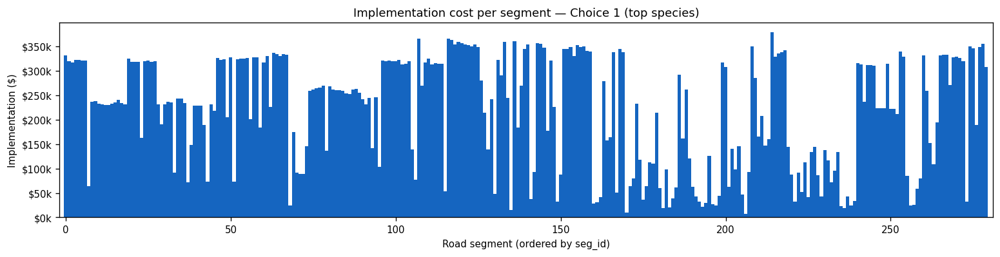

In [ ]:
# Cell 9 — Implementation cost per segment (Choice 1)
def plot_per_segment(costs, value_col, title, ylabel, color):
    d = costs.sort_values("seg_id").reset_index(drop=True)
    fig, ax = plt.subplots(figsize=(13,3.4))
    ax.bar(range(len(d)), d[value_col], width=1.0, color=color, edgecolor="none")
    ax.set_title(title); ax.set_ylabel(ylabel); ax.set_xlabel("Road segment (ordered by seg_id)")
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x,_: f"${x/1e3:,.0f}k"))
    ax.margins(x=0.005)
    plt.tight_layout(); plt.show()

plot_per_segment(choice_costs[1], "implementation_total",
                 "Implementation cost per segment — Choice 1 (top species)",
                 "Implementation ($)", "#1565C0")

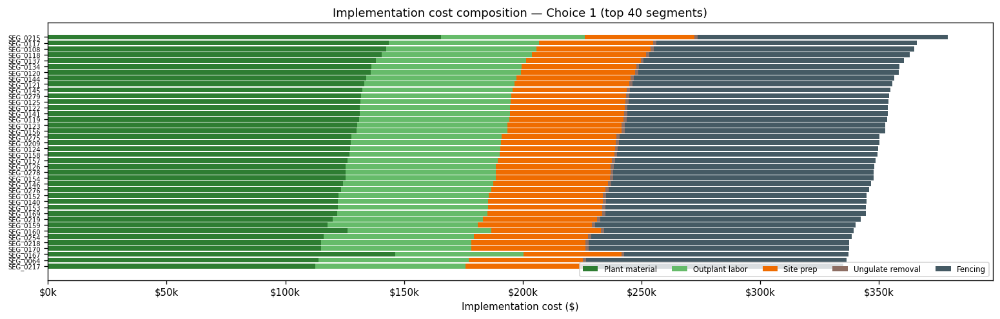

In [ ]:
# Cell 10 — Implementation cost composition (stacked, Choice 1, top 40 segments by total)
d = choice_costs[1].nlargest(40, "implementation_total").sort_values("implementation_total")
comp = ["impl_plant_material","impl_outplant_labor","impl_site_prep",
        "impl_ungulate_removal","impl_fencing"]
labels = ["Plant material","Outplant labor","Site prep","Ungulate removal","Fencing"]
colors = ["#2E7D32","#66BB6A","#EF6C00","#8D6E63","#455A64"]
fig, ax = plt.subplots(figsize=(13,4.2))
bottom = np.zeros(len(d))
for c,l,col in zip(comp,labels,colors):
    ax.barh(range(len(d)), d[c], left=bottom, color=col, label=l, height=0.85)
    bottom += d[c].values
ax.set_yticks(range(len(d))); ax.set_yticklabels(d["seg_id"], fontsize=6)
ax.set_xlabel("Implementation cost ($)")
ax.set_title("Implementation cost composition — Choice 1 (top 40 segments)")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x,_: f"${x/1e3:,.0f}k"))
ax.legend(ncol=5, fontsize=7, loc="lower right")
plt.tight_layout(); plt.show()

## 6. Maintenance cost — plots

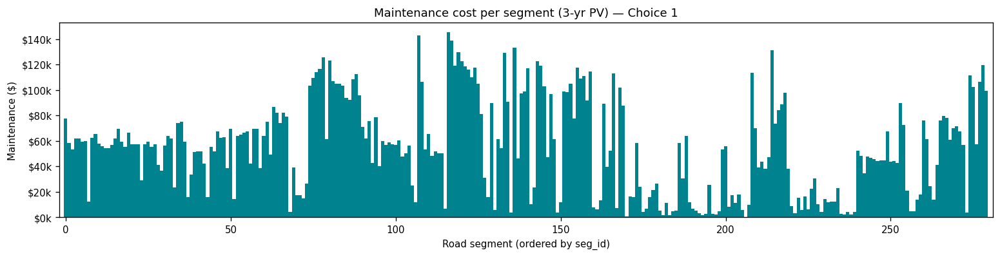

In [ ]:
# Cell 11 — Maintenance cost per segment (Choice 1)
plot_per_segment(choice_costs[1], "maintenance_total",
                 "Maintenance cost per segment (3-yr PV) — Choice 1",
                 "Maintenance ($)", "#00838F")

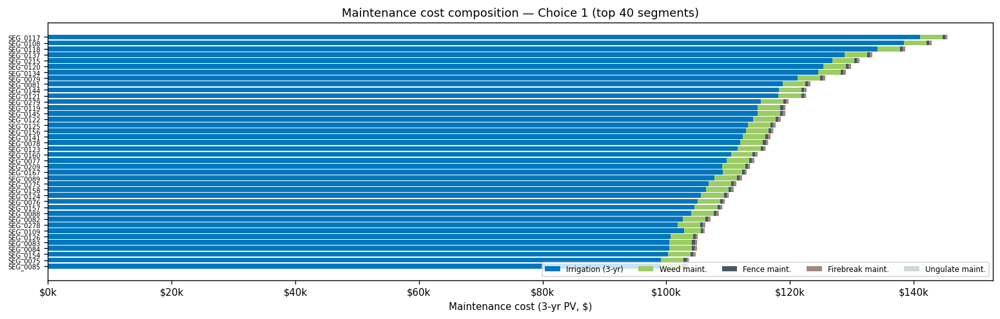

In [ ]:
# Cell 12 — Maintenance composition (stacked, Choice 1, top 40 by total)
d = choice_costs[1].nlargest(40, "maintenance_total").sort_values("maintenance_total")
comp = ["maint_irrigation_3yr","maint_weed_pv","maint_fence_pv",
        "maint_firebreak_pv","maint_ungulate_pv"]
labels = ["Irrigation (3-yr)","Weed maint.","Fence maint.","Firebreak maint.","Ungulate maint."]
colors = ["#0277BD","#9CCC65","#455A64","#A1887F","#CFD8DC"]
fig, ax = plt.subplots(figsize=(13,4.2))
bottom = np.zeros(len(d))
for c,l,col in zip(comp,labels,colors):
    ax.barh(range(len(d)), d[c], left=bottom, color=col, label=l, height=0.85)
    bottom += d[c].values
ax.set_yticks(range(len(d))); ax.set_yticklabels(d["seg_id"], fontsize=6)
ax.set_xlabel("Maintenance cost (3-yr PV, $)")
ax.set_title("Maintenance cost composition — Choice 1 (top 40 segments)")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x,_: f"${x/1e3:,.0f}k"))
ax.legend(ncol=5, fontsize=7, loc="lower right")
plt.tight_layout(); plt.show()

## 7. Combined plot — implementation + maintenance per segment

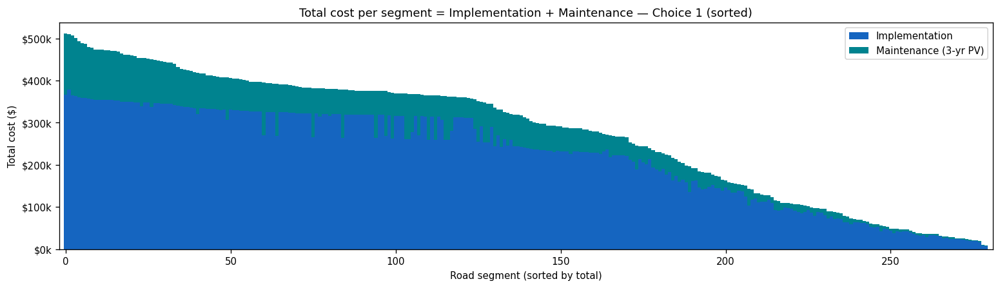

In [ ]:
# Cell 13 — Combined stacked: implementation vs maintenance per segment (Choice 1)
d = choice_costs[1].sort_values("grand_total", ascending=False).reset_index(drop=True)
fig, ax = plt.subplots(figsize=(13,3.8))
x = range(len(d))
ax.bar(x, d["implementation_total"], width=1.0, color="#1565C0", label="Implementation")
ax.bar(x, d["maintenance_total"], bottom=d["implementation_total"], width=1.0,
       color="#00838F", label="Maintenance (3-yr PV)")
ax.set_title("Total cost per segment = Implementation + Maintenance — Choice 1 (sorted)")
ax.set_ylabel("Total cost ($)"); ax.set_xlabel("Road segment (sorted by total)")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x,_: f"${x/1e3:,.0f}k"))
ax.legend(); ax.margins(x=0.005)
plt.tight_layout(); plt.show()

## 8. Per-tier comparison

How program cost and the implementation/maintenance split change by **height tier**
(Choice 1 = High, Choice 2 = Medium, Choice 3 = Low). Only **plant material** varies by tier
(different species prices and how many segments carry that tier); all area/perimeter-based Wada
costs and irrigation are tier-independent. A fully layered fuel break plants all three tiers, so
the realistic total is closer to the **sum across tiers for plant material** plus one shared set of
the area/perimeter costs — see the note under the table.


           Impl total  Maint total  Grand total Plant material Mean $/segment
Choice                                                                       
Choice 1  $61,693,624  $15,367,715  $77,061,339    $21,517,674       $275,219
Choice 2  $66,784,074  $15,367,715  $82,151,790    $26,608,124       $293,399
Choice 3  $53,597,475  $15,367,715  $68,965,190    $13,421,525       $246,304


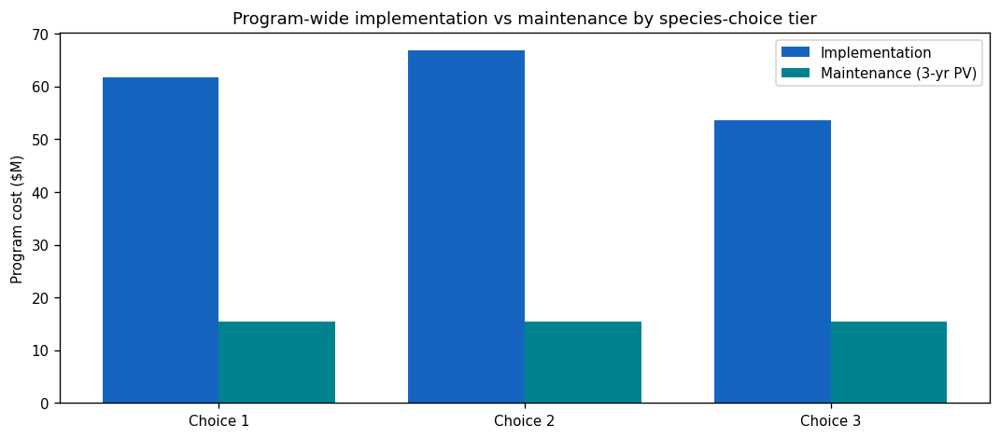


Layered (all 3 tiers) plant material: $61,547,322
Shared area/perimeter + maintenance:  $55,543,666
LAYERED ALL-TIERS PROGRAM TOTAL:      $117,090,988


In [ ]:
# Cell 14 — Program totals by choice tier
rows = []
for i in range(1, N_CHOICES+1):
    c = choice_costs[i]
    rows.append({
        "Choice": f"Choice {i}",
        "Impl total":  c["implementation_total"].sum(),
        "Maint total": c["maintenance_total"].sum(),
        "Grand total": c["grand_total"].sum(),
        "Plant material": c["impl_plant_material"].sum(),
        "Mean $/segment": c["grand_total"].mean(),
    })
prog = pd.DataFrame(rows).set_index("Choice")
disp = prog.copy()
for col in disp.columns:
    disp[col] = disp[col].map(lambda v: f"${v:,.0f}")
print(disp.to_string())

# grouped bar
fig, ax = plt.subplots(figsize=(9,4))
idx = np.arange(N_CHOICES); w=0.38
ax.bar(idx-w/2, prog["Impl total"]/1e6, w, label="Implementation", color="#1565C0")
ax.bar(idx+w/2, prog["Maint total"]/1e6, w, label="Maintenance (3-yr PV)", color="#00838F")
ax.set_xticks(idx); ax.set_xticklabels(prog.index)
ax.set_ylabel("Program cost ($M)")
ax.set_title("Program-wide implementation vs maintenance by species-choice tier")
ax.legend(); plt.tight_layout(); plt.show()

# All-tiers layered budget: sum plant material across tiers + ONE set of shared costs
shared = (choice_costs[1]["implementation_total"].sum()
          - choice_costs[1]["impl_plant_material"].sum()
          + choice_costs[1]["maintenance_total"].sum())
layered_plants = sum(choice_costs[i]["impl_plant_material"].sum() for i in range(1, N_CHOICES+1))
print(f"\nLayered (all 3 tiers) plant material: ${layered_plants:,.0f}")
print(f"Shared area/perimeter + maintenance:  ${shared:,.0f}")
print(f"LAYERED ALL-TIERS PROGRAM TOTAL:      ${layered_plants+shared:,.0f}")

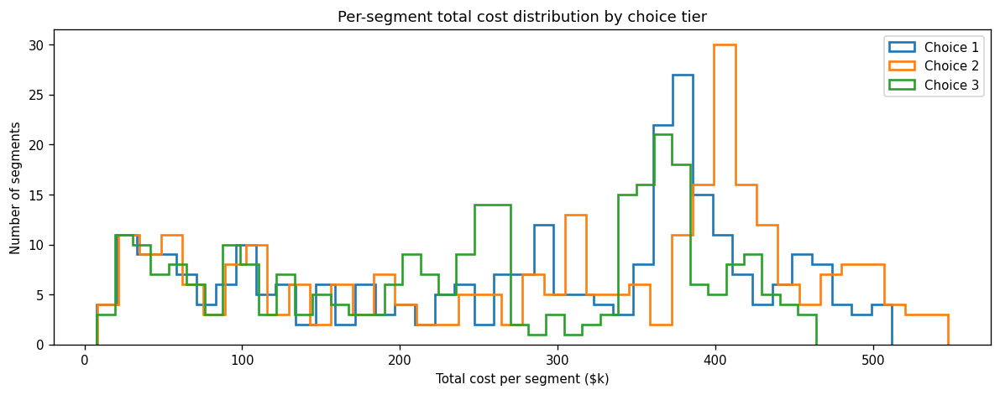

In [ ]:
# Cell 15 — Per-segment total cost distribution by choice (overlaid)
fig, ax = plt.subplots(figsize=(10,4))
for i in range(1, N_CHOICES+1):
    ax.hist(choice_costs[i]["grand_total"]/1e3, bins=40, histtype="step", linewidth=1.6,
            label=f"Choice {i}")
ax.set_xlabel("Total cost per segment ($k)"); ax.set_ylabel("Number of segments")
ax.set_title("Per-segment total cost distribution by choice tier")
ax.legend(); plt.tight_layout(); plt.show()

## 9. Detailed summary tables

In [ ]:
# Cell 16 — Detailed per-component summary (Choice 1), program-wide and per-hectare
c = choice_costs[1]
total_area = c["area_ha"].sum()
items = [
    ("IMPLEMENTATION", None),
    ("  Plant material",      "impl_plant_material"),
    ("  Outplanting labor",   "impl_outplant_labor"),
    ("  Site preparation",    "impl_site_prep"),
    ("  Ungulate removal",    "impl_ungulate_removal"),
    ("  Fencing",             "impl_fencing"),
    ("  → Implementation subtotal", "implementation_total"),
    ("MAINTENANCE (3-yr PV)", None),
    ("  Irrigation (3-yr)",   "maint_irrigation_3yr"),
    ("  Weed maintenance",    "maint_weed_pv"),
    ("  Fence maintenance",   "maint_fence_pv"),
    ("  Firebreak maintenance","maint_firebreak_pv"),
    ("  Ungulate maintenance","maint_ungulate_pv"),
    ("  → Maintenance subtotal","maintenance_total"),
    ("GRAND TOTAL",           "grand_total"),
]
rows=[]
for label, col in items:
    if col is None:
        rows.append({"Cost item":label,"Program total ($)":"","$ / ha":"","% of grand total":""})
    else:
        tot=c[col].sum()
        rows.append({"Cost item":label,
                     "Program total ($)":f"${tot:,.0f}",
                     "$ / ha":f"${tot/total_area:,.0f}",
                     "% of grand total":f"{tot/c['grand_total'].sum()*100:5.1f}%"})
summary = pd.DataFrame(rows)
print(f"Choice 1 — {len(c)} segments, {total_area:,.0f} ha total\n")
print(summary.to_string(index=False))

Choice 1 — 280 segments, 1,188 ha total

                  Cost item Program total ($)  $ / ha % of grand total
             IMPLEMENTATION                                           
             Plant material       $21,517,674 $18,106            27.9%
          Outplanting labor       $10,507,578  $8,842            13.6%
           Site preparation        $7,181,145  $6,043             9.3%
           Ungulate removal          $258,027    $217             0.3%
                    Fencing       $22,229,200 $18,705            28.8%
  → Implementation subtotal       $61,693,624 $51,912            80.1%
      MAINTENANCE (3-yr PV)                                           
          Irrigation (3-yr)       $14,471,661 $12,177            18.8%
           Weed maintenance          $725,860    $611             0.9%
          Fence maintenance           $86,668     $73             0.1%
      Firebreak maintenance           $76,086     $64             0.1%
       Ungulate maintenance         

In [ ]:
# Cell 17 — Per-road summary (Choice 1)
c = choice_costs[1]
by_road = c.groupby("road_name").agg(
    segments=("seg_id","count"),
    area_ha=("area_ha","sum"),
    implementation=("implementation_total","sum"),
    maintenance=("maintenance_total","sum"),
    grand_total=("grand_total","sum"),
).sort_values("grand_total", ascending=False)
by_road["$/ha"] = by_road["grand_total"]/by_road["area_ha"]
disp = by_road.copy()
for col in ["implementation","maintenance","grand_total","$/ha"]:
    disp[col]=disp[col].map(lambda v:f"${v:,.0f}")
disp["area_ha"]=disp["area_ha"].map(lambda v:f"{v:,.1f}")
print("Per-road cost summary — Choice 1\n")
print(disp.to_string())
print(f"\nPROGRAM TOTAL (Choice 1): ${c['grand_total'].sum():,.0f}"
      f"  ({len(c)} segments, {c['area_ha'].sum():,.0f} ha)")

Per-road cost summary — Choice 1

                 segments area_ha implementation maintenance  grand_total     $/ha
road_name                                                                         
QUEEN KAAHUMANU        50   229.4    $13,462,932  $4,280,796  $17,743,728  $77,352
HAWAII BELT            45   219.9    $11,760,411  $2,119,817  $13,880,228  $63,112
DANIEL K INOUYE        38   215.5     $9,268,722  $2,969,710  $12,238,432  $56,786
WAIKOLOA               27   115.3     $6,478,036  $1,603,140   $8,081,176  $70,113
KAWAIHAE               39   109.8     $6,137,915  $1,290,291   $7,428,206  $67,640
MAMALAHOA              38    97.1     $5,358,850  $1,047,765   $6,406,615  $65,966
SADDLE                 21   107.9     $4,632,169  $1,090,048   $5,722,217  $53,052
KOHALA MOUNTAIN        16    73.1     $3,294,174    $561,055   $3,855,228  $52,739
AKONI PULE              5    14.9       $979,170    $308,116   $1,287,286  $86,395
KE ALA KOA              1     5.5       $321,244     

In [ ]:
# Cell 18 — Full per-segment table + CSV export (all choices)
full = choice_costs[1].copy()
full = full.rename(columns={"species":"choice_1_species"})
for i in range(2, N_CHOICES+1):
    full[f"choice_{i}_species"]      = choice_costs[i]["species"].values
    full[f"choice_{i}_impl"]         = choice_costs[i]["implementation_total"].values
    full[f"choice_{i}_maint"]        = choice_costs[i]["maintenance_total"].values
    full[f"choice_{i}_grand_total"]  = choice_costs[i]["grand_total"].values
full = full.rename(columns={"implementation_total":"choice_1_impl",
                            "maintenance_total":"choice_1_maint",
                            "grand_total":"choice_1_grand_total"})
out_csv = "green_fuel_break_segment_costs.csv"
full.to_csv(out_csv, index=False)
print(f"Wrote {out_csv} ({len(full)} segments, {full.shape[1]} columns)")
try:
    from google.colab import files as _f; _f.download(out_csv)
except Exception:
    pass
full.head()

Wrote green_fuel_break_segment_costs.csv (280 segments, 29 columns)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,seg_id,road_name,elev_class,area_ha,length_m,n_plants,choice_1_species,perimeter_m,impl_plant_material,impl_outplant_labor,impl_site_prep,impl_ungulate_removal,impl_fencing,choice_1_impl,maint_irrigation_3yr,maint_weed_pv,maint_ungulate_pv,maint_fence_pv,maint_firebreak_pv,choice_1_maint,choice_1_grand_total,choice_2_species,choice_2_impl,choice_2_maint,choice_2_grand_total,choice_3_species,choice_3_impl,choice_3_maint,choice_3_grand_total
0,SEG_0001,HAWAII BELT,low,6.0,1000.0,9105.47,Naio,2120.0,109265.64,63288.679014,48199.77562,1302.696638,109665.739138,331722.530411,72982.85,3664.633019,37.56825,427.567753,384.13344,77496.752462,409219.282873,ʻAʻaliʻi,359038.940411,77496.752462,436535.692873,ʻUhaloa,295300.650411,77496.752462,372797.402873
1,SEG_0002,HAWAII BELT,low,6.0,1000.0,8103.20,Naio,2120.0,97238.40,63288.679014,48199.77562,1302.696638,109665.739138,319695.290411,53779.43,3664.633019,37.56825,427.567753,384.13344,58293.332462,377988.622873,ʻAʻaliʻi,344004.890411,58293.332462,402298.222873,Alaheʻe,319695.290411,58293.332462,377988.622873
2,SEG_0003,HAWAII BELT,low,6.0,1000.0,7815.06,Naio,2120.0,93780.72,63288.679014,48199.77562,1302.696638,109665.739138,316237.610411,48770.22,3664.633019,37.56825,427.567753,384.13344,53284.122462,369521.732873,ʻAʻaliʻi,339682.790411,53284.122462,392966.912873,Alaheʻe,316237.610411,53284.122462,369521.732873
3,SEG_0004,HAWAII BELT,low,6.0,1000.0,8280.45,Naio,2120.0,99365.40,63288.679014,48199.77562,1302.696638,109665.739138,321822.290411,57191.09,3664.633019,37.56825,427.567753,384.13344,61704.992462,383527.282873,ʻAʻaliʻi,346663.640411,61704.992462,408368.632873,Alaheʻe,321822.290411,61704.992462,383527.282873
4,SEG_0005,HAWAII BELT,low,6.0,1000.0,8295.86,Naio,2120.0,99550.32,63288.679014,48199.77562,1302.696638,109665.739138,322007.210411,57474.01,3664.633019,37.56825,427.567753,384.13344,61987.912462,383995.122873,ʻAʻaliʻi,346894.790411,61987.912462,408882.702873,Alaheʻe,322007.210411,61987.912462,383995.122873


## 10. Missing / required itemized costs — flags

1. **`gonative_nursery_costs.xlsx` is empty.** Plant prices come from `outplanting_costs_hawaii.xlsx`
   (May 2026 *retail upper-bound*). Bulk restoration rates (Future Forests $4–6/plant at 1,000 units;
   DLNR dibble $2) would cut plant material ~50–75%. Add a bulk-price column for a real large order.

2. **Elevation from the Hawaii 10 m DEM.** With the complete ArcInfo grid folder in the zip, the
   notebook reads it directly (rasterio/GDAL) and assigns each segment's low/high class at the 1,000 m
   threshold. Any segment that samples as nodata falls back to the road-name proxy so none are dropped.

3. **Layered planting vs single tier.** Each "choice" is one height tier. The per-tier totals are not
   additive for the shared site-prep/fencing/irrigation (those happen once per segment regardless of
   how many tiers are planted). Use Cell 14's note to build an all-tiers-layered budget: sum the three
   tiers' **plant material**, then add **one** set of the area/perimeter costs.

4. **Irrigation interpretation.** CSV `cost_3yr` is treated as the PV of 3-yr establishment irrigation
   under maintenance. Adjust Cell 8 to relabel or re-discount.

5. **Costs absent from all sources (set to zero):** base-yard/overhead (Wada excludes), mobilization/
   access, monitoring labor beyond ungulate monitoring, permitting for endangered species, and
   post-3-yr long-horizon maintenance.

6. **Fencing** uses `FENCE_FRACTION = 0.5` (one-sided upslope corridor). Set to 1.0 for full perimeter.


In [ ]:
# ── MAP CELL A: Load boundary and road segment geometries from Drive ──────────
import glob as _glob

DRIVE_DATA_DIR = '/content/drive/MyDrive/25-26/26S'

# ── Locate NKSK boundary shapefile ────────────────────────────────────────────
bnd_hits = _glob.glob(f'{DRIVE_DATA_DIR}/**/*.shp', recursive=True)
bnd_hits = [p for p in bnd_hits if 'bound' in p.lower() or 'nksk' in p.lower()
            and 'road' not in p.lower() and 'segment' not in p.lower()]
if not bnd_hits:
    # fallback: any shp that isn't the road segments
    bnd_hits = [p for p in _glob.glob(f'{DRIVE_DATA_DIR}/**/*.shp', recursive=True)
                if 'road_segments_scored' not in p]
print('Boundary candidates found:')
for p in bnd_hits: print(f'  {p}')
BOUNDARY_SHP = bnd_hits[0]
print(f'\nUsing boundary: {BOUNDARY_SHP}')

# ── Locate road segments scored shapefile ─────────────────────────────────────
seg_hits = _glob.glob(f'{DRIVE_DATA_DIR}/**/road_segments_scored.shp', recursive=True)
if not seg_hits:
    seg_hits = _glob.glob(f'{DRIVE_DATA_DIR}/**/*segment*scored*.shp', recursive=True)
print(f'\nRoad segments scored: {seg_hits[0] if seg_hits else "NOT FOUND"}')
SCORED_SHP = seg_hits[0] if seg_hits else SEGMENTS_SHP   # fall back to already-loaded


# ── Load both layers ──────────────────────────────────────────────────────────
gdf_boundary = gpd.read_file(BOUNDARY_SHP).to_crs(epsg=3857)
gdf_segs_geo = gpd.read_file(SCORED_SHP).to_crs(epsg=3857)

print(f'\nBoundary CRS:  {gdf_boundary.crs}  |  {len(gdf_boundary)} feature(s)')
print(f'Segments CRS:  {gdf_segs_geo.crs}  |  {len(gdf_segs_geo)} features')
print(f'Boundary bounds: {gdf_boundary.total_bounds.round(0)}')


# ── Helper: build the per-choice GeoDataFrame for plotting ───────────────────
def _build_map_gdf(choice_num):
    """
    Merge choice_costs[choice_num] onto the scored segment geometry.
    Returns a GeoDataFrame in EPSG:3857 ready for plotting.
    """
    cc = choice_costs[choice_num].copy()
    gdf_m = gdf_segs_geo[['seg_id', 'geometry']].merge(cc, on='seg_id', how='left')
    return gpd.GeoDataFrame(gdf_m, geometry='geometry', crs='EPSG:3857')

Boundary candidates found:
  /content/drive/MyDrive/25-26/26S/NKSK-boundaries/nksk.shp

Using boundary: /content/drive/MyDrive/25-26/26S/NKSK-boundaries/nksk.shp

Road segments scored: NOT FOUND

Boundary CRS:  EPSG:3857  |  1 feature(s)
Segments CRS:  EPSG:3857  |  280 features
Boundary bounds: [-17370354.   2211764. -17306238.   2285544.]


In [ ]:
# ── MAP CELL B: Shared map-plotting helpers ────────────────────────────────────
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.patheffects as pe

try:
    import contextily as cx
    HAS_CTX = True
except ImportError:
    HAS_CTX = False
    print("contextily not installed — installing now...")
    import subprocess, sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "contextily"])
    import contextily as cx
    HAS_CTX = True
    print("contextily installed.")

CMAPS = {
    'implementation': 'Blues',
    'maintenance':    'Greens',
    'combined':       'plasma',
}

METRIC_LABELS = {
    'implementation_total': 'Implementation Cost ($)',
    'maintenance_total':    'Maintenance Cost — 3-yr PV ($)',
    'grand_total':          'Total Cost: Implementation + Maintenance ($)',
}

TIER_LABELS = {
    1: 'Choice 1 — High Tier',
    2: 'Choice 2 — Medium Tier',
    3: 'Choice 3 — Low Tier',
}

SAVE_DIR = '/content/drive/MyDrive/25-26/26S'


def _road_labels(gdf_m, ax):
    """Annotate one label per road at the geometry centroid."""
    road_label_df = (
        gdf_m.groupby('road_name')
        .apply(lambda g: g.geometry.unary_union.centroid)
        .reset_index()
    )
    road_label_df.columns = ['road_name', 'centroid']
    for _, row in road_label_df.iterrows():
        ax.annotate(
            text       = row['road_name'],
            xy         = (row['centroid'].x, row['centroid'].y),
            fontsize   = 7,
            fontweight = 'bold',
            color      = 'white',
            ha         = 'center',
            va         = 'center',
            bbox       = dict(boxstyle='round,pad=0.2', fc='#333333',
                              alpha=0.65, ec='none'),
        )


def plot_cost_map(choice_num, metric_col, cmap_name, title_suffix,
                  file_tag, lw=3.5):
    """Draw one map: boundary fill + road segments colored by metric_col."""
    gdf_m = _build_map_gdf(choice_num)

    plotted = gdf_m[gdf_m[metric_col].notna() & (gdf_m[metric_col] > 0)]
    missing = gdf_m[~gdf_m.index.isin(plotted.index)]

    vmin = plotted[metric_col].quantile(0.02)
    vmax = plotted[metric_col].quantile(0.98)
    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap(cmap_name)

    fig, ax = plt.subplots(figsize=(14, 10))

    # Boundary
    gdf_boundary.plot(ax=ax, facecolor='none', edgecolor='#555555',
                      linewidth=1.2, zorder=2)

    # Segments with no species in this tier (grey)
    if len(missing):
        missing.plot(ax=ax, color='#999999', linewidth=1.5,
                     zorder=3, label='No species / tier absent')

    # Colored segments
    plotted.plot(
        ax        = ax,
        column    = metric_col,
        cmap      = cmap_name,
        linewidth = lw,
        norm      = norm,
        legend    = False,
        zorder    = 4,
        missing_kwds = {'color': '#999999'},
    )

    # Basemap
    if HAS_CTX:
        try:
            cx.add_basemap(ax, source=cx.providers.Esri.WorldShadedRelief,
                           attribution=False, zoom='auto')
        except Exception:
            pass

    # Colorbar
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical',
                        fraction=0.025, pad=0.02, shrink=0.7)
    cbar.set_label(METRIC_LABELS[metric_col], fontsize=11)
    cbar.ax.yaxis.set_major_formatter(
        mticker.FuncFormatter(lambda x, _: f'${x/1e3:,.0f}k'))

    # Road labels
    _road_labels(gdf_m, ax)

    # Species legend
    sp_counts = gdf_m['species'].value_counts().head(3)
    sp_text   = 'Top species:\n' + '\n'.join(
        f'  {sp} ({n} segs)' for sp, n in sp_counts.items()
        if sp is not None and not (isinstance(sp, float)))
    ax.text(0.01, 0.01, sp_text, transform=ax.transAxes,
            fontsize=8, verticalalignment='bottom',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.75))

    ax.set_title(
        f'NKSK Green Fuel Break — {title_suffix}\n{TIER_LABELS[choice_num]}',
        fontsize=12, pad=10)
    ax.set_axis_off()
    plt.tight_layout()

    fname = os.path.join(SAVE_DIR, f'cost_map_ch{choice_num}_{file_tag}.png')
    plt.savefig(fname, dpi=180, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

import matplotlib.patheffects as pe

CMAPS = {
    'implementation': 'Blues',
    'maintenance':    'Greens',
    'combined':       'plasma',
}

METRIC_LABELS = {
    'implementation_total': 'Implementation Cost ($)',
    'maintenance_total':    'Maintenance Cost — 3-yr PV ($)',
    'grand_total':          'Total Cost: Implementation + Maintenance ($)',
}

TIER_LABELS = {
    1: 'Choice 1 — High Tier',
    2: 'Choice 2 — Medium Tier',
    3: 'Choice 3 — Low Tier',
}

SAVE_DIR = '/content/drive/MyDrive/25-26/26S'   # all maps saved alongside the notebook


def _road_labels(gdf_m, ax):
    """Annotate one label per road at the geometry centroid."""
    road_label_df = (
        gdf_m.groupby('road_name')
        .apply(lambda g: g.geometry.unary_union.centroid)
        .reset_index()
    )
    road_label_df.columns = ['road_name', 'centroid']
    for _, row in road_label_df.iterrows():
        ax.annotate(
            text       = row['road_name'],
            xy         = (row['centroid'].x, row['centroid'].y),
            fontsize   = 7,
            fontweight = 'bold',
            color      = 'white',
            ha         = 'center',
            va         = 'center',
            bbox       = dict(boxstyle='round,pad=0.2', fc='#333333',
                              alpha=0.65, ec='none'),
        )


def plot_cost_map(choice_num, metric_col, cmap_name, title_suffix,
                  file_tag, lw=3.5):
    """
    Draw one map: boundary fill + road segments colored by metric_col.
    Saves to SAVE_DIR.
    """
    gdf_m = _build_map_gdf(choice_num)

    # Drop rows with no species for this tier (no cost)
    plotted = gdf_m[gdf_m[metric_col].notna() & (gdf_m[metric_col] > 0)]
    missing = gdf_m[~gdf_m.index.isin(plotted.index)]

    vmin = plotted[metric_col].quantile(0.02)
    vmax = plotted[metric_col].quantile(0.98)
    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap(cmap_name)

    fig, ax = plt.subplots(figsize=(14, 10))

    # Boundary
    gdf_boundary.plot(ax=ax, facecolor='none', edgecolor='#555555',
                      linewidth=1.2, zorder=2)

    # Segments with no species in this tier (grey)
    if len(missing):
        missing.plot(ax=ax, color='#999999', linewidth=1.5,
                     zorder=3, label='No species / tier absent')

    # Colored segments
    plotted.plot(
        ax        = ax,
        column    = metric_col,
        cmap      = cmap_name,
        linewidth = lw,
        norm      = norm,
        legend    = False,
        zorder    = 4,
        missing_kwds = {'color': '#999999'},
    )

    # Basemap
    if HAS_CTX:
        try:
            cx.add_basemap(ax, source=cx.providers.Esri.WorldShadedRelief,
                           attribution=False, zoom='auto')
        except Exception:
            pass

    # Colorbar
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical',
                        fraction=0.025, pad=0.02, shrink=0.7)
    cbar.set_label(METRIC_LABELS[metric_col], fontsize=11)
    cbar.ax.yaxis.set_major_formatter(
        mticker.FuncFormatter(lambda x, _: f'${x/1e3:,.0f}k'))

    # Road labels
    _road_labels(gdf_m, ax)

    # Species legend (top species for this tier)
    sp_counts = gdf_m['species'].value_counts().head(3)
    sp_text   = 'Top species:\n' + '\n'.join(
        f'  {sp} ({n} segs)' for sp, n in sp_counts.items() if sp is not None)
    ax.text(0.01, 0.01, sp_text, transform=ax.transAxes,
            fontsize=8, verticalalignment='bottom',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.75))

    ax.set_title(
        f'NKSK Green Fuel Break — {title_suffix}\n{TIER_LABELS[choice_num]}',
        fontsize=12, pad=10)
    ax.set_axis_off()
    plt.tight_layout()

    fname = os.path.join(SAVE_DIR,
                         f'cost_map_ch{choice_num}_{file_tag}.png')
    plt.savefig(fname, dpi=180, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

contextily not installed — installing now...
contextily installed.


CHOICE 1 — HIGH TIER


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


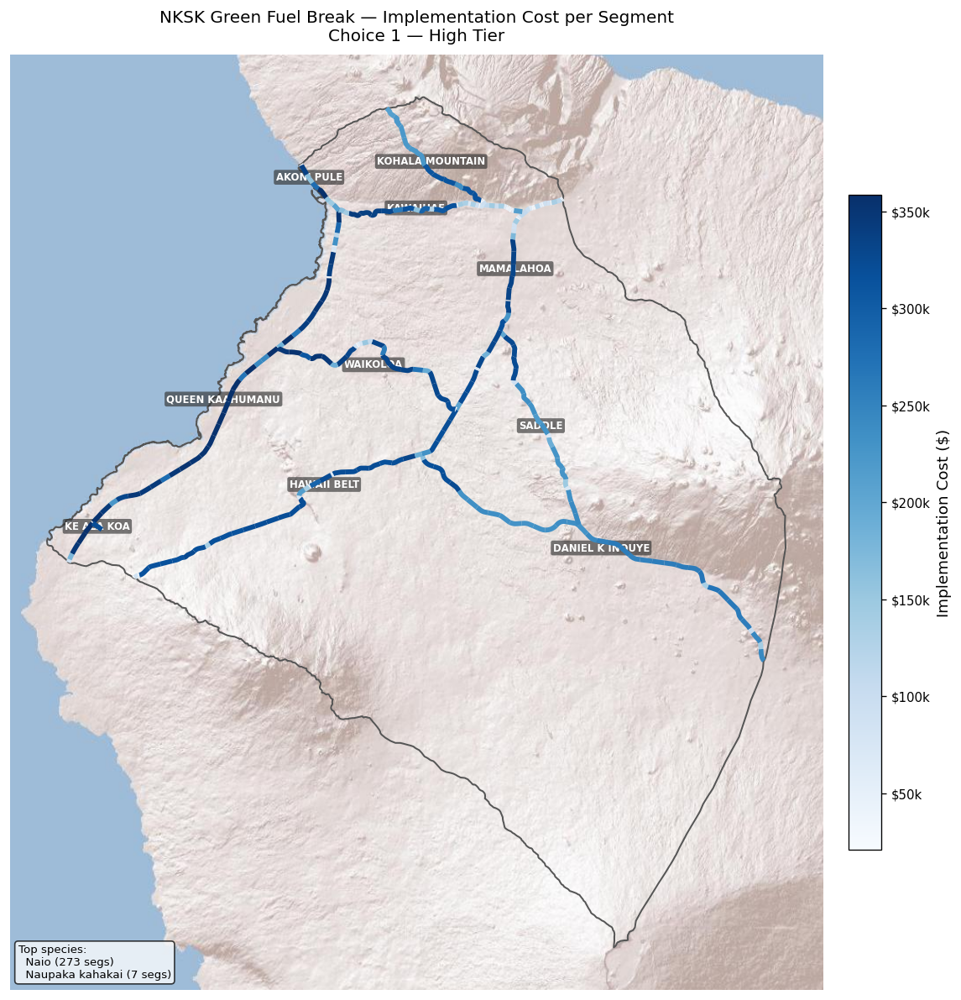

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch1_implementation.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


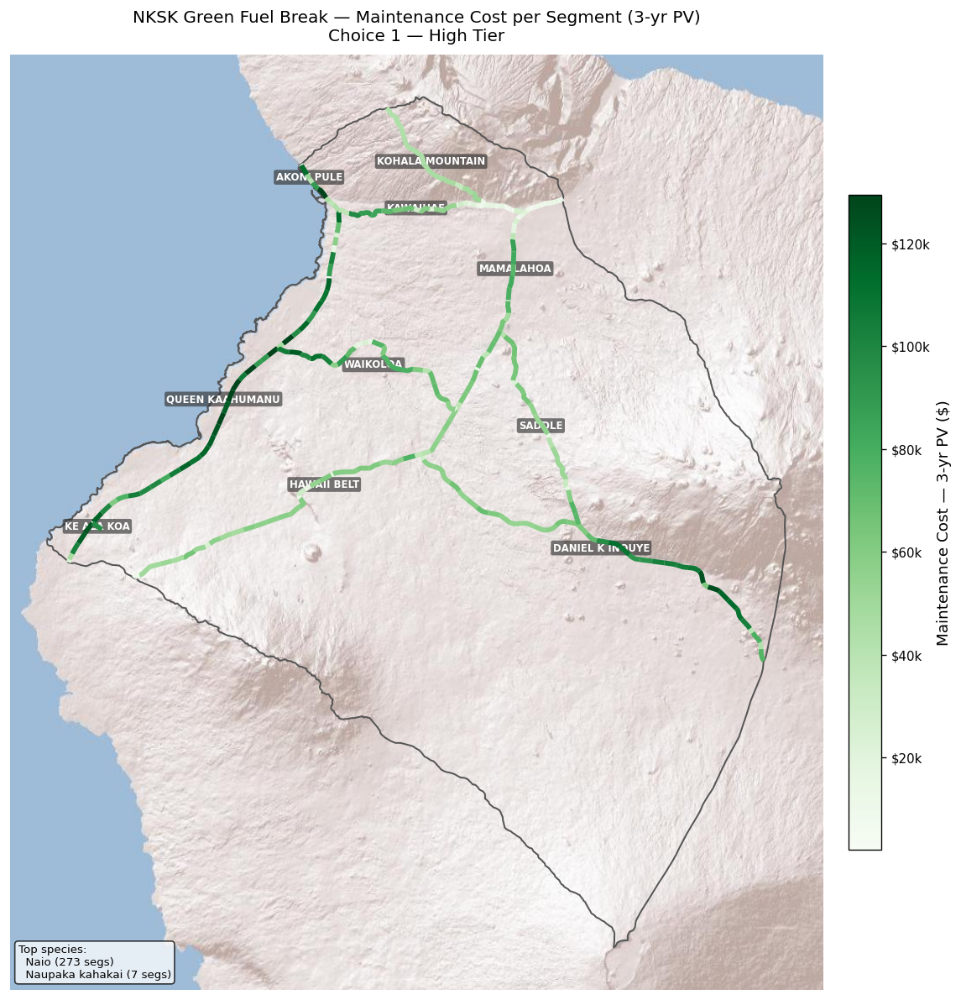

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch1_maintenance.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


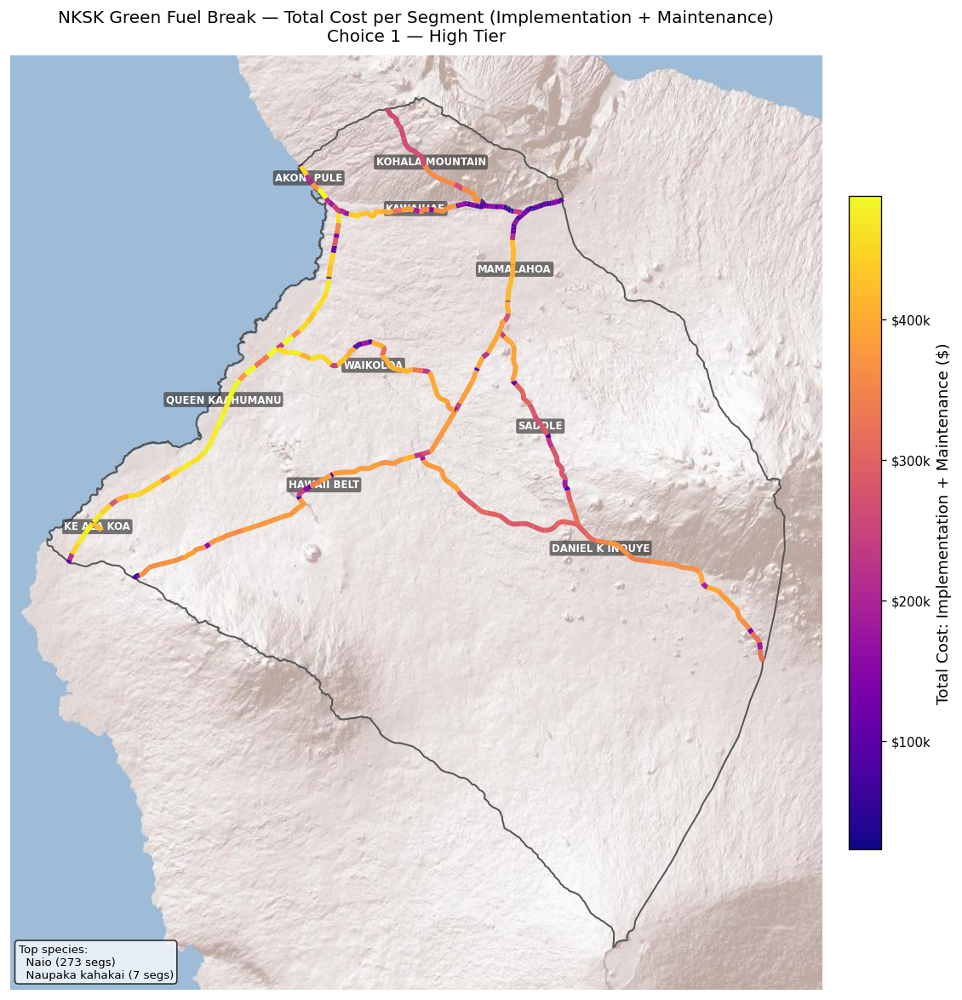

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch1_combined.png


In [ ]:
# ── MAP CELL C: Choice 1 — High Tier — all three cost maps ───────────────────

print('=' * 60)
print('CHOICE 1 — HIGH TIER')
print('=' * 60)

plot_cost_map(
    choice_num   = 1,
    metric_col   = 'implementation_total',
    cmap_name    = CMAPS['implementation'],
    title_suffix = 'Implementation Cost per Segment',
    file_tag     = 'implementation',
)

plot_cost_map(
    choice_num   = 1,
    metric_col   = 'maintenance_total',
    cmap_name    = CMAPS['maintenance'],
    title_suffix = 'Maintenance Cost per Segment (3-yr PV)',
    file_tag     = 'maintenance',
)

plot_cost_map(
    choice_num   = 1,
    metric_col   = 'grand_total',
    cmap_name    = CMAPS['combined'],
    title_suffix = 'Total Cost per Segment (Implementation + Maintenance)',
    file_tag     = 'combined',
)

CHOICE 2 — MEDIUM TIER


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


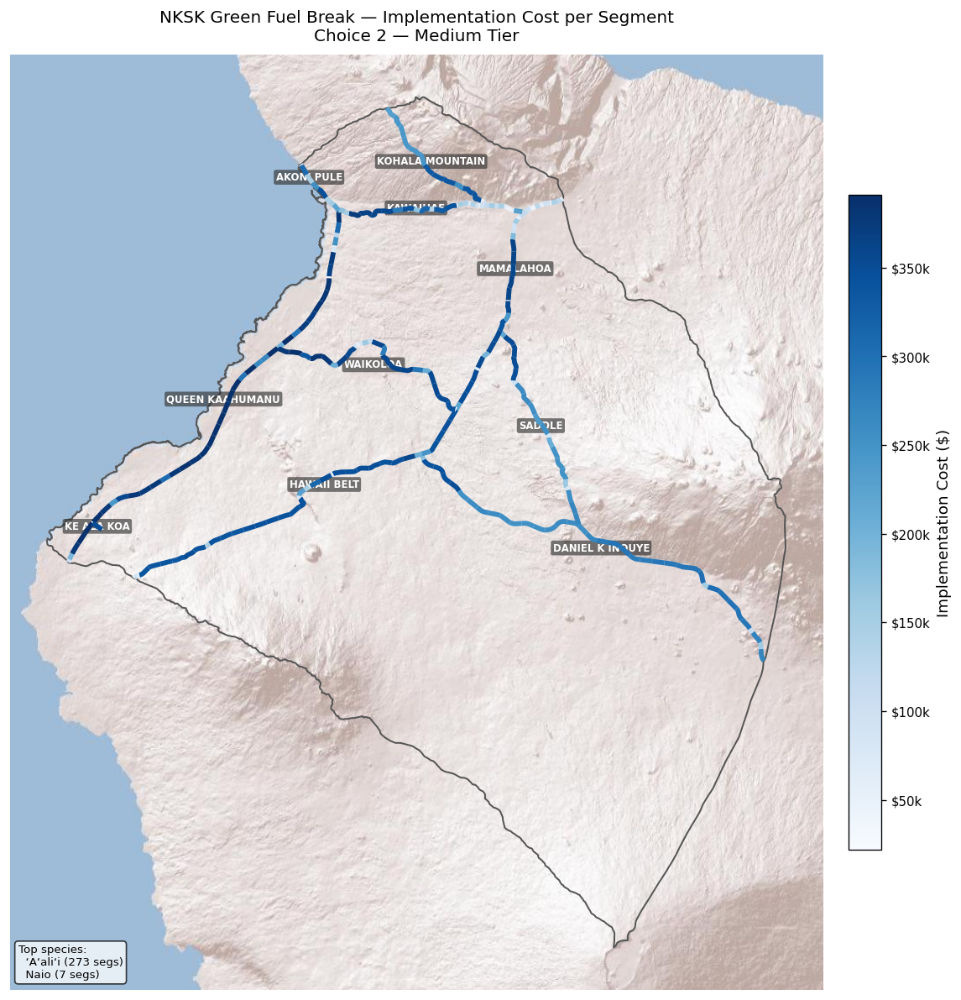

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch2_implementation.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


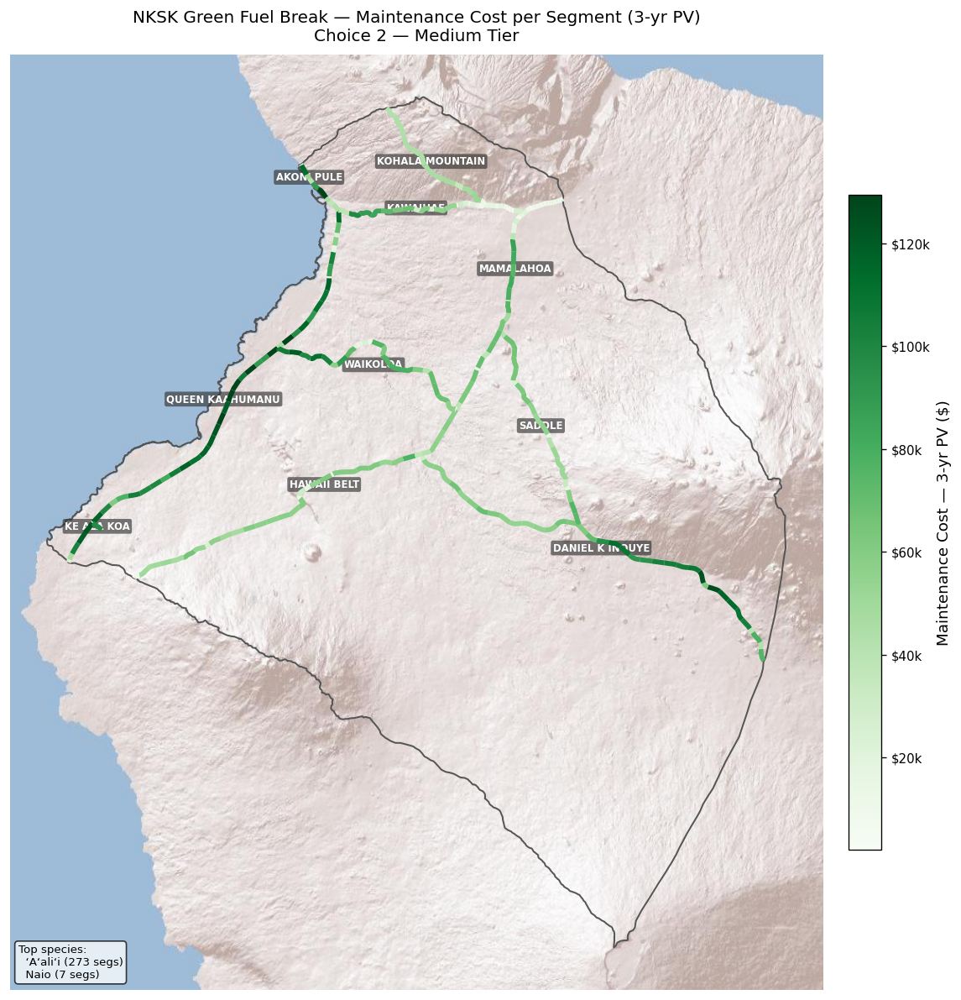

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch2_maintenance.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


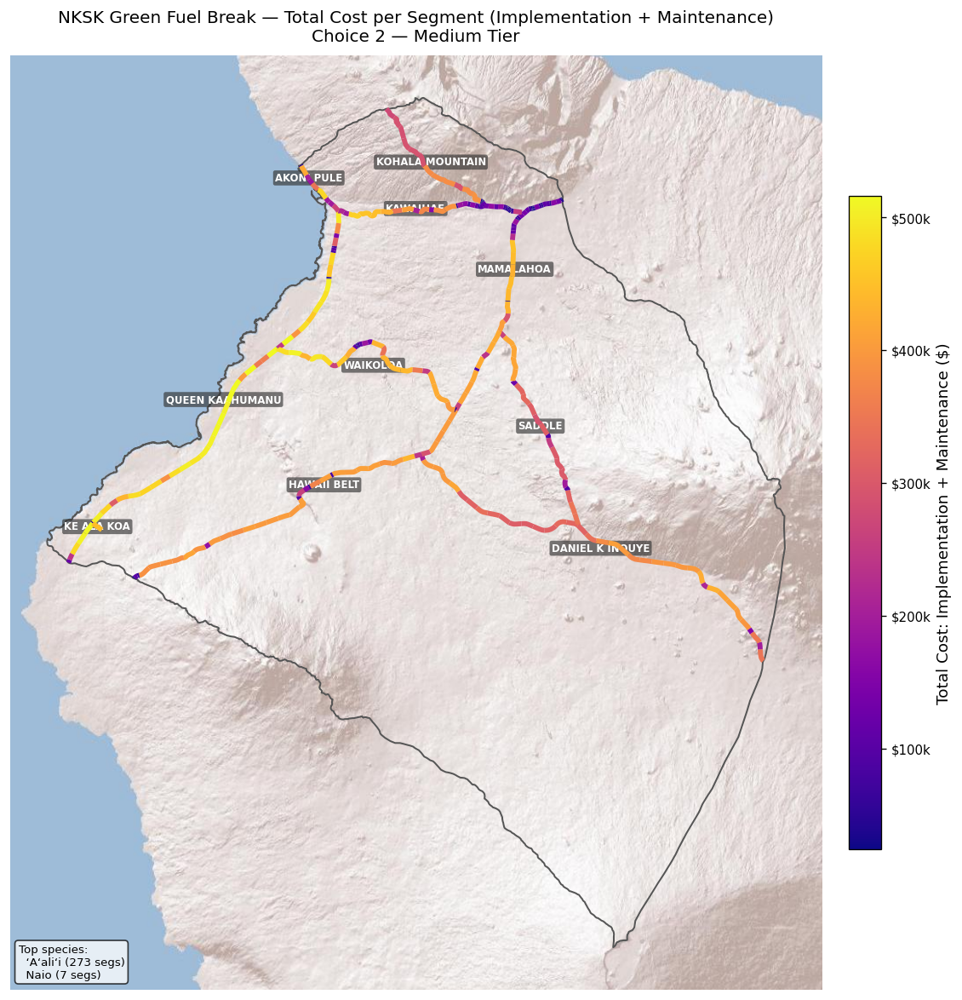

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch2_combined.png


In [ ]:
# ── MAP CELL D: Choice 2 — Medium Tier — all three cost maps ─────────────────

print('=' * 60)
print('CHOICE 2 — MEDIUM TIER')
print('=' * 60)

plot_cost_map(
    choice_num   = 2,
    metric_col   = 'implementation_total',
    cmap_name    = CMAPS['implementation'],
    title_suffix = 'Implementation Cost per Segment',
    file_tag     = 'implementation',
)

plot_cost_map(
    choice_num   = 2,
    metric_col   = 'maintenance_total',
    cmap_name    = CMAPS['maintenance'],
    title_suffix = 'Maintenance Cost per Segment (3-yr PV)',
    file_tag     = 'maintenance',
)

plot_cost_map(
    choice_num   = 2,
    metric_col   = 'grand_total',
    cmap_name    = CMAPS['combined'],
    title_suffix = 'Total Cost per Segment (Implementation + Maintenance)',
    file_tag     = 'combined',
)

CHOICE 3 — LOW TIER


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


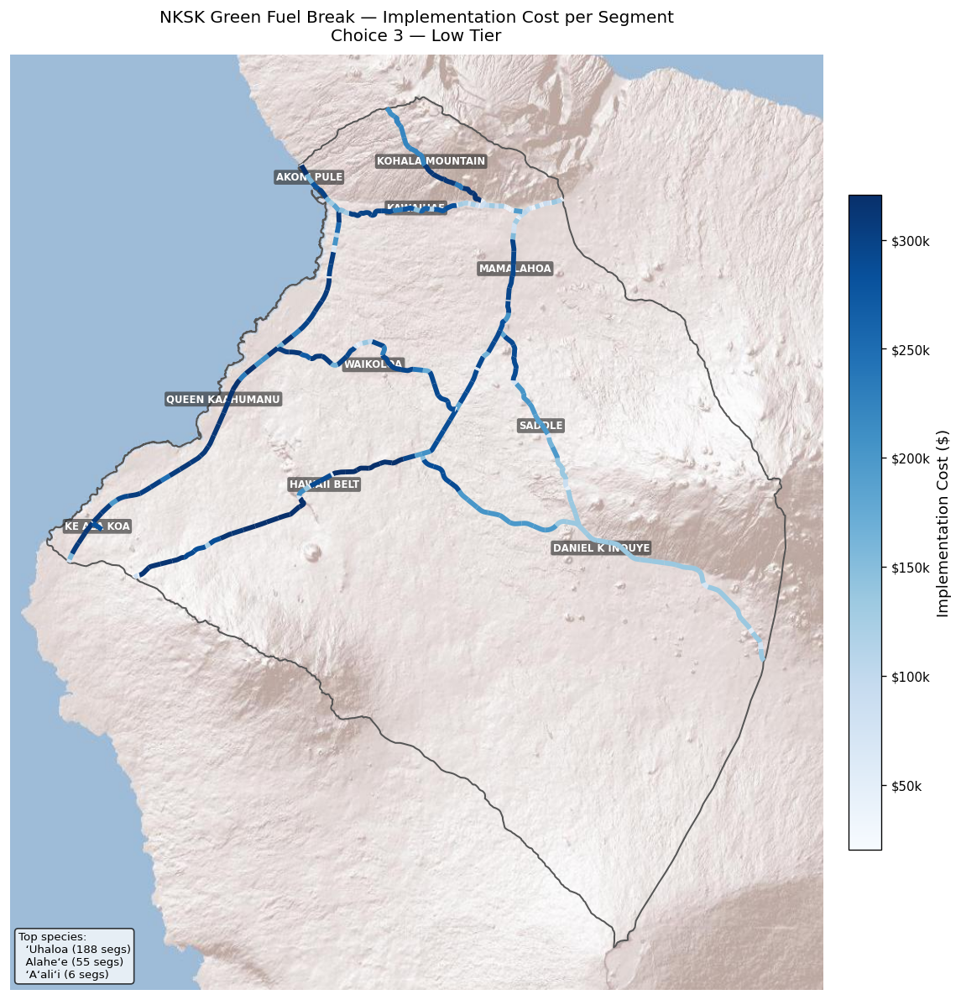

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch3_implementation.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


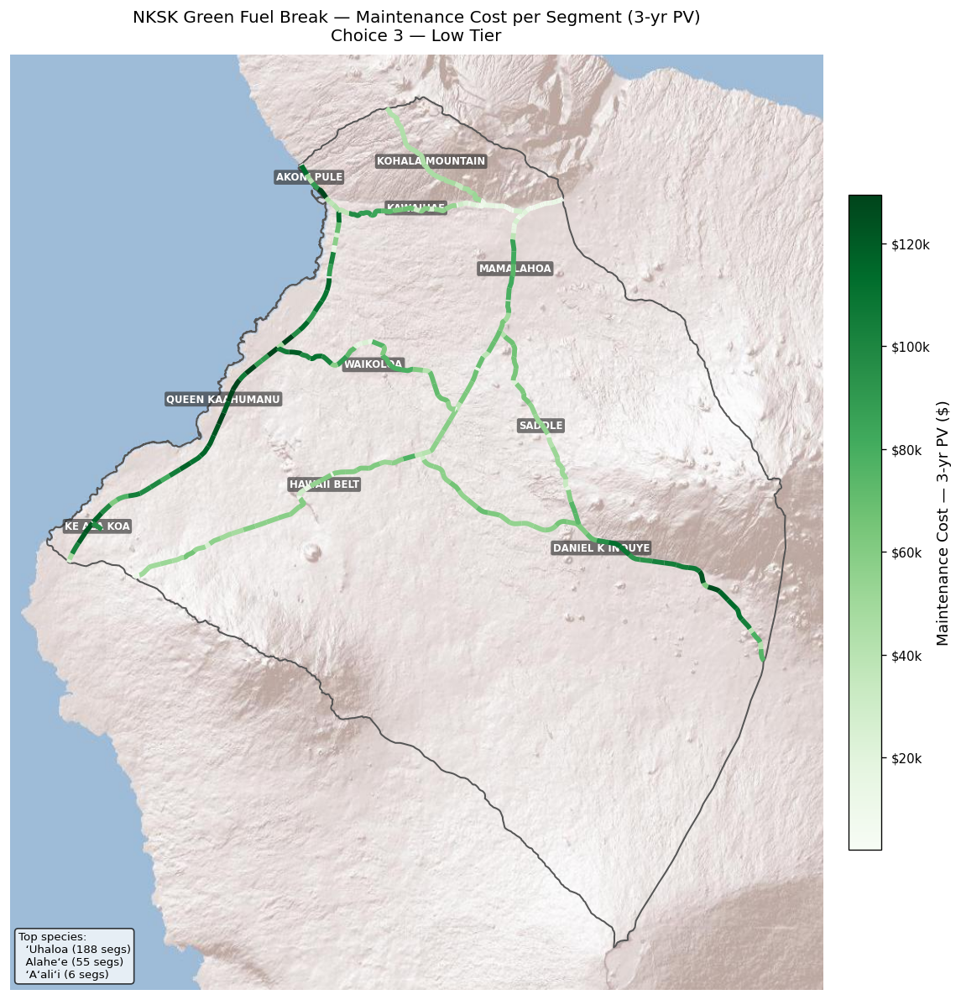

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch3_maintenance.png


/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda g: g.geometry.unary_union.centroid)
/tmp/ipykernel_1529/1068410246.py:164: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.geometry.unary_union.centroid)


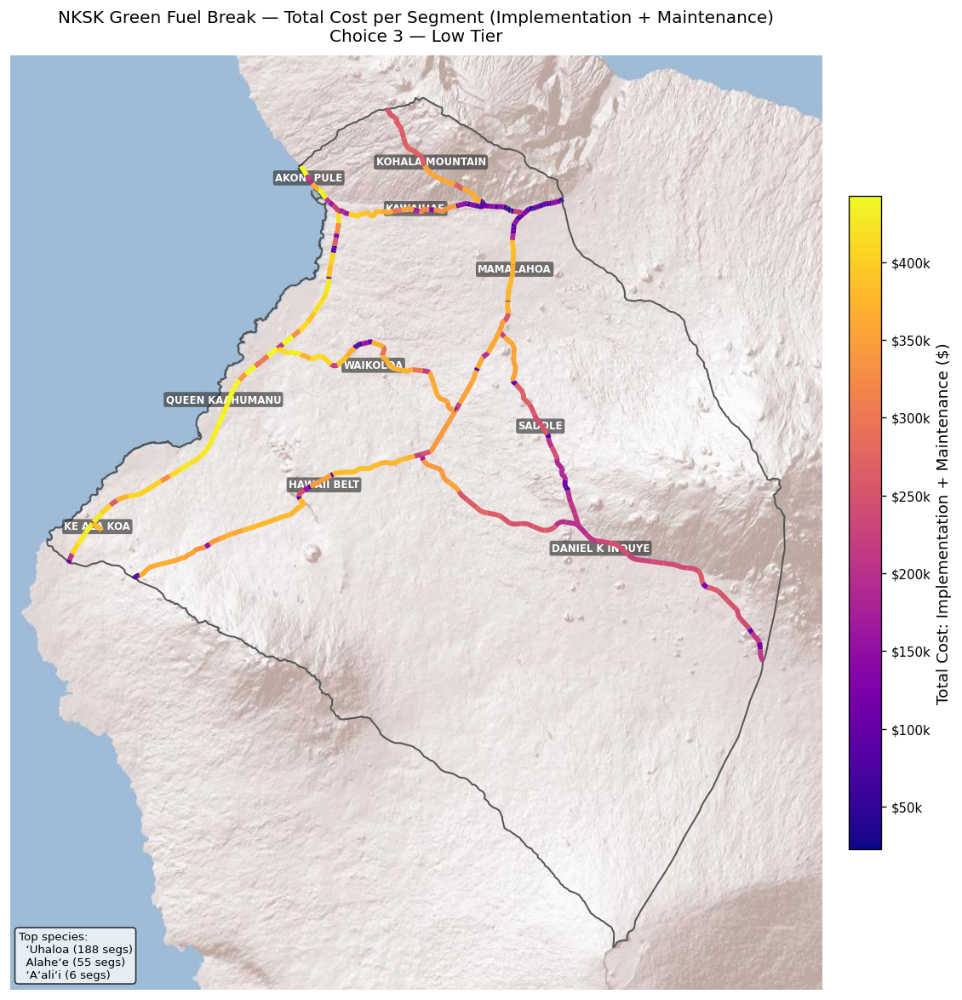

Saved: /content/drive/MyDrive/25-26/26S/cost_map_ch3_combined.png


In [ ]:
# ── MAP CELL E: Choice 3 — Low Tier — all three cost maps ────────────────────

print('=' * 60)
print('CHOICE 3 — LOW TIER')
print('=' * 60)

plot_cost_map(
    choice_num   = 3,
    metric_col   = 'implementation_total',
    cmap_name    = CMAPS['implementation'],
    title_suffix = 'Implementation Cost per Segment',
    file_tag     = 'implementation',
)

plot_cost_map(
    choice_num   = 3,
    metric_col   = 'maintenance_total',
    cmap_name    = CMAPS['maintenance'],
    title_suffix = 'Maintenance Cost per Segment (3-yr PV)',
    file_tag     = 'maintenance',
)

plot_cost_map(
    choice_num   = 3,
    metric_col   = 'grand_total',
    cmap_name    = CMAPS['combined'],
    title_suffix = 'Total Cost per Segment (Implementation + Maintenance)',
    file_tag     = 'combined',
)

In [ ]:
# ── Cell A: Build road-corridor summary table for stacked bar charts ──────────
# Aggregates choice_costs[1] (the primary tier / High-tier species) by road corridor.
# Uses area-weighted sums so corridors with more segments are represented proportionally.

CHART_CHOICE = 1   # change to 2 or 3 to chart a different tier

df_c = choice_costs[CHART_CHOICE].copy()

impl_components  = ["impl_plant_material", "impl_outplant_labor",
                    "impl_site_prep", "impl_ungulate_removal", "impl_fencing"]
maint_components = ["maint_irrigation_3yr", "maint_weed_pv",
                    "maint_ungulate_pv", "maint_fence_pv", "maint_firebreak_pv"]

road_agg = (
    df_c.groupby("road_name")[impl_components + maint_components
                              + ["implementation_total", "maintenance_total", "grand_total"]]
    .sum()
    .reset_index()
)

# Sort by grand_total ascending so the most expensive road is at the top of each chart
road_agg = road_agg.sort_values("grand_total", ascending=True).reset_index(drop=True)

print(road_agg[["road_name", "implementation_total", "maintenance_total", "grand_total"]]
      .to_string(index=False))

      road_name  implementation_total  maintenance_total  grand_total
     KE ALA KOA          3.212439e+05       9.697859e+04 4.182225e+05
     AKONI PULE          9.791700e+05       3.081160e+05 1.287286e+06
KOHALA MOUNTAIN          3.294174e+06       5.610549e+05 3.855228e+06
         SADDLE          4.632169e+06       1.090048e+06 5.722217e+06
      MAMALAHOA          5.358850e+06       1.047765e+06 6.406615e+06
       KAWAIHAE          6.137915e+06       1.290291e+06 7.428206e+06
       WAIKOLOA          6.478036e+06       1.603140e+06 8.081176e+06
DANIEL K INOUYE          9.268722e+06       2.969710e+06 1.223843e+07
    HAWAII BELT          1.176041e+07       2.119817e+06 1.388023e+07
QUEEN KAAHUMANU          1.346293e+07       4.280796e+06 1.774373e+07


NameError: name 'NOTEBOOK_FOLDER' is not defined

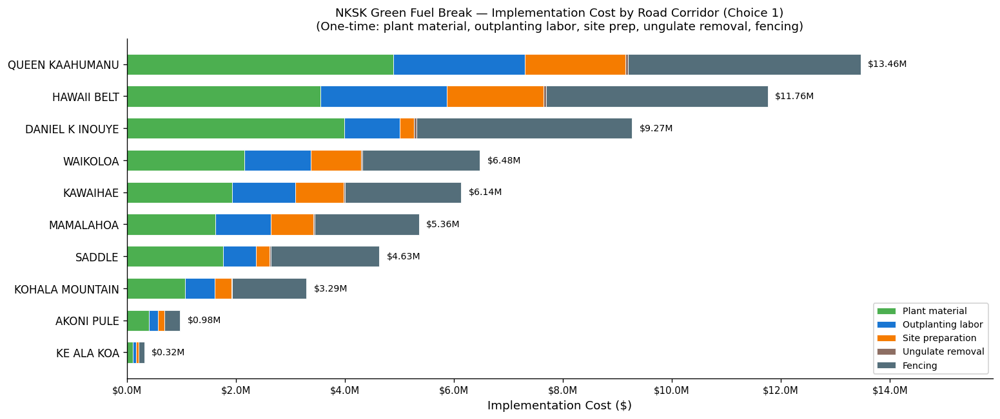

In [ ]:
# ── Cell B: Figure — Implementation cost by road corridor ─────────────────────

impl_labels = [
    "Plant material",
    "Outplanting labor",
    "Site preparation",
    "Ungulate removal",
    "Fencing",
]
impl_colors = ["#4CAF50", "#1976D2", "#F57C00", "#8D6E63", "#546E7A"]

fig, ax = plt.subplots(figsize=(13, 5.5))

roads   = road_agg["road_name"].tolist()
y_pos   = np.arange(len(roads))
cumsum  = np.zeros(len(roads))

for col, label, color in zip(impl_components, impl_labels, impl_colors):
    vals = road_agg[col].values
    ax.barh(y_pos, vals, left=cumsum, color=color, label=label,
            edgecolor="white", linewidth=0.5, height=0.65)
    cumsum += vals

# Total label at the end of each bar
for i, total in enumerate(road_agg["implementation_total"]):
    ax.text(total + road_agg["implementation_total"].max() * 0.01, i,
            f"${total/1e6:,.2f}M", va="center", ha="left", fontsize=8.5)

ax.set_yticks(y_pos)
ax.set_yticklabels(roads, fontsize=10)
ax.set_xlabel("Implementation Cost ($)", fontsize=11)
ax.set_title(
    f"NKSK Green Fuel Break — Implementation Cost by Road Corridor (Choice {CHART_CHOICE})\n"
    "(One-time: plant material, outplanting labor, site prep, ungulate removal, fencing)",
    fontsize=11, pad=8
)
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1e6:,.1f}M"))
ax.legend(loc="lower right", fontsize=8.5, framealpha=0.85)
ax.set_xlim(0, road_agg["implementation_total"].max() * 1.18)
ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
impl_bar_path = os.path.join(NOTEBOOK_FOLDER, f"NKSK_implementation_cost_by_road_ch{CHART_CHOICE}.png")
plt.savefig(impl_bar_path, dpi=180, bbox_inches="tight")
plt.show()
print(f"Saved: {impl_bar_path}")

NameError: name 'NOTEBOOK_FOLDER' is not defined

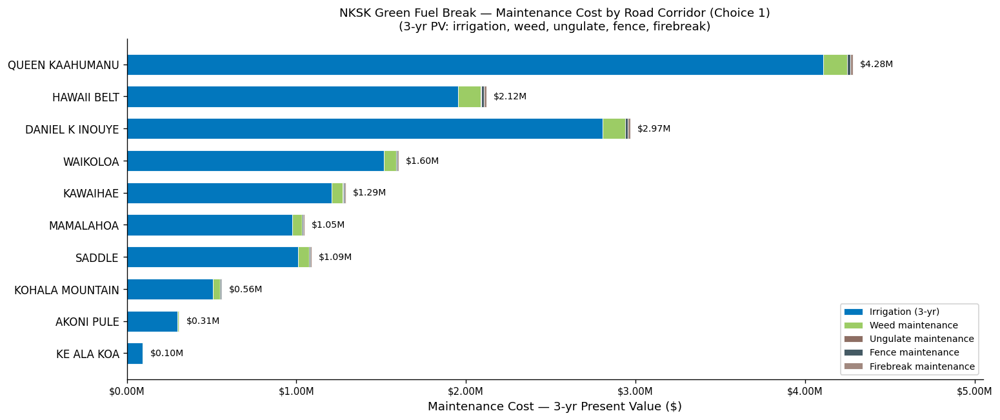

In [ ]:
# ── Cell C: Figure — Maintenance cost by road corridor ────────────────────────

maint_labels = [
    "Irrigation (3-yr)",
    "Weed maintenance",
    "Ungulate maintenance",
    "Fence maintenance",
    "Firebreak maintenance",
]
maint_colors = ["#0277BD", "#9CCC65", "#8D6E63", "#455A64", "#A1887F"]

fig, ax = plt.subplots(figsize=(13, 5.5))

cumsum = np.zeros(len(roads))

for col, label, color in zip(maint_components, maint_labels, maint_colors):
    vals = road_agg[col].values
    ax.barh(y_pos, vals, left=cumsum, color=color, label=label,
            edgecolor="white", linewidth=0.5, height=0.65)
    cumsum += vals

for i, total in enumerate(road_agg["maintenance_total"]):
    ax.text(total + road_agg["maintenance_total"].max() * 0.01, i,
            f"${total/1e6:,.2f}M", va="center", ha="left", fontsize=8.5)

ax.set_yticks(y_pos)
ax.set_yticklabels(roads, fontsize=10)
ax.set_xlabel("Maintenance Cost — 3-yr Present Value ($)", fontsize=11)
ax.set_title(
    f"NKSK Green Fuel Break — Maintenance Cost by Road Corridor (Choice {CHART_CHOICE})\n"
    "(3-yr PV: irrigation, weed, ungulate, fence, firebreak)",
    fontsize=11, pad=8
)
# AFTER
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1e6:,.2f}M"))
ax.legend(loc="lower right", fontsize=8.5, framealpha=0.85)
ax.set_xlim(0, road_agg["maintenance_total"].max() * 1.18)
ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
maint_bar_path = os.path.join(NOTEBOOK_FOLDER, f"NKSK_maintenance_cost_by_road_ch{CHART_CHOICE}.png")
plt.savefig(maint_bar_path, dpi=180, bbox_inches="tight")
plt.show()
print(f"Saved: {maint_bar_path}")

NameError: name 'NOTEBOOK_FOLDER' is not defined

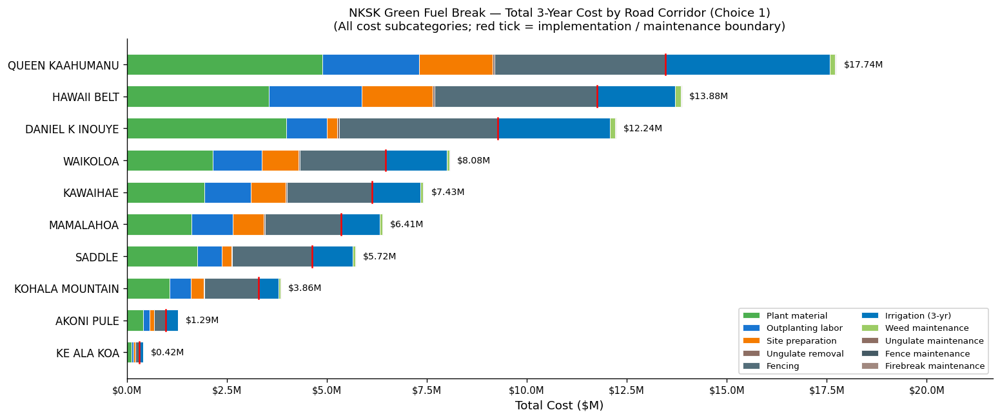

In [ ]:
# ── Cell D: Figure — Total cost by road corridor, all subcategories ───────────

all_components = impl_components + maint_components

all_labels = [
    # Implementation
    "Plant material",
    "Outplanting labor",
    "Site preparation",
    "Ungulate removal",
    "Fencing",
    # Maintenance
    "Irrigation (3-yr)",
    "Weed maintenance",
    "Ungulate maintenance",
    "Fence maintenance",
    "Firebreak maintenance",
]
all_colors = [
    # Implementation — blues/greens
    "#4CAF50",   # plant material
    "#1976D2",   # outplanting labor
    "#F57C00",   # site prep
    "#8D6E63",   # ungulate removal
    "#546E7A",   # fencing
    # Maintenance — warmer tones
    "#0277BD",   # irrigation
    "#9CCC65",   # weed
    "#8D6E63",   # ungulate maint (lighter than removal)
    "#455A64",   # fence maint
    "#A1887F",   # firebreak
]

fig, ax = plt.subplots(figsize=(13, 5.5))

cumsum = np.zeros(len(roads))

for col, label, color in zip(all_components, all_labels, all_colors):
    vals = road_agg[col].values
    ax.barh(y_pos, vals, left=cumsum, color=color, label=label,
            edgecolor="white", linewidth=0.5, height=0.65)
    cumsum += vals

# Total label at end of each bar
for i, total in enumerate(road_agg["grand_total"]):
    ax.text(total + road_agg["grand_total"].max() * 0.01, i,
            f"${total/1e6:,.2f}M", va="center", ha="left", fontsize=8.5)

# Divider line between implementation and maintenance segments
# Draw a vertical dashed line at the mean implementation_total as a visual boundary hint
impl_end = road_agg["implementation_total"]
for i, x in enumerate(impl_end):
    ax.plot([x, x], [i - 0.33, i + 0.33],
            color="red", linewidth=1.5, zorder=5)

ax.set_yticks(y_pos)
ax.set_yticklabels(roads, fontsize=10)
ax.set_xlabel("Total Cost ($M)", fontsize=11)
ax.set_title(
    f"NKSK Green Fuel Break — Total 3-Year Cost by Road Corridor (Choice {CHART_CHOICE})\n"
    "(All cost subcategories; red tick = implementation / maintenance boundary)",
    fontsize=11, pad=8
)
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1e6:,.1f}M"))
ax.legend(loc="lower right", fontsize=8, framealpha=0.85, ncol=2)
ax.set_xlim(0, road_agg["grand_total"].max() * 1.22)
ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
total_bar_path = os.path.join(NOTEBOOK_FOLDER, f"NKSK_total_cost_by_road_ch{CHART_CHOICE}.png")
plt.savefig(total_bar_path, dpi=180, bbox_inches="tight")
plt.show()
print(f"Saved: {total_bar_path}")